In [3]:
!pip install optunahub

Defaulting to user installation because normal site-packages is not writeable


## Start

In [4]:
from sentence_transformers import SentenceTransformer

C:\Users\P\AppData\Roaming\Python\Python313\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import HTML

In [56]:


import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import f1_score, hamming_loss
from sklearn.feature_selection import SelectFromModel
import optuna
import logging
import sys
from sklearn.model_selection import cross_val_score
import numpy as np
from optuna.visualization import plot_contour,plot_rank

0         False
1         False
2         False
3         False
4         False
          ...  
155339    False
155340    False
155341    False
155342    False
155343    False
Length: 155344, dtype: bool
590
0         False
1         False
2         False
3         False
4         False
          ...  
155339    False
155340    False
155341    False
155342    False
155343    False
Length: 154754, dtype: bool
15044
<class 'pandas.core.frame.DataFrame'>
Index: 139710 entries, 0 to 155343
Data columns (total 10 columns):
 #   Column                          Non-Null Count   Dtype 
---  ------                          --------------   ----- 
 0   Investors                       139710 non-null  object
 1   Primary Contact                 139709 non-null  object
 2   Description                     139710 non-null  object
 3   Geography                       139710 non-null  object
 4   Preferred Industry              139696 non-null  object
 5   Preferred Investment Type       139168 non-n

C:\Users\P\AppData\Local\Temp\ipykernel_56944\607891812.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  investment_type_count = investment_type_count.dropna()[~investment_type_count['Investment Categories'].isin(['Not specific','Not relevant'])]
C:\Users\P\AppData\Local\Temp\ipykernel_56944\4087647590.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  geography_count = geography_count.dropna()[~geography_count['Geography Categories_by countries'].isin(['Not specific','Not Relevant'])]
C:\Users\P\AppData\Local\Temp\ipykernel_56944\29434665.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  investment_type_count = investment_type_count.dropna()[~investment_type_count['Investment Categories'].isin(['Not specific','Not relevant'])]


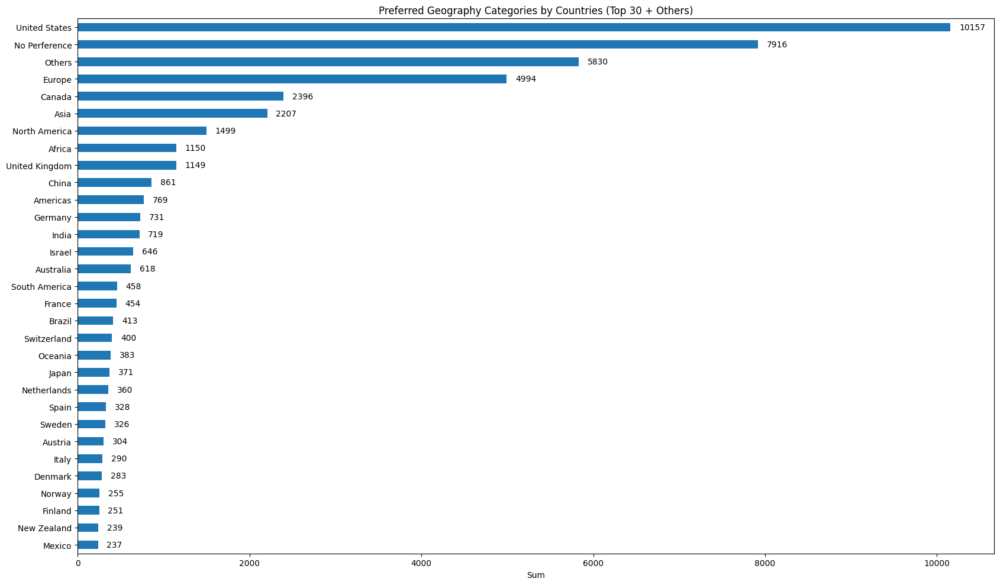

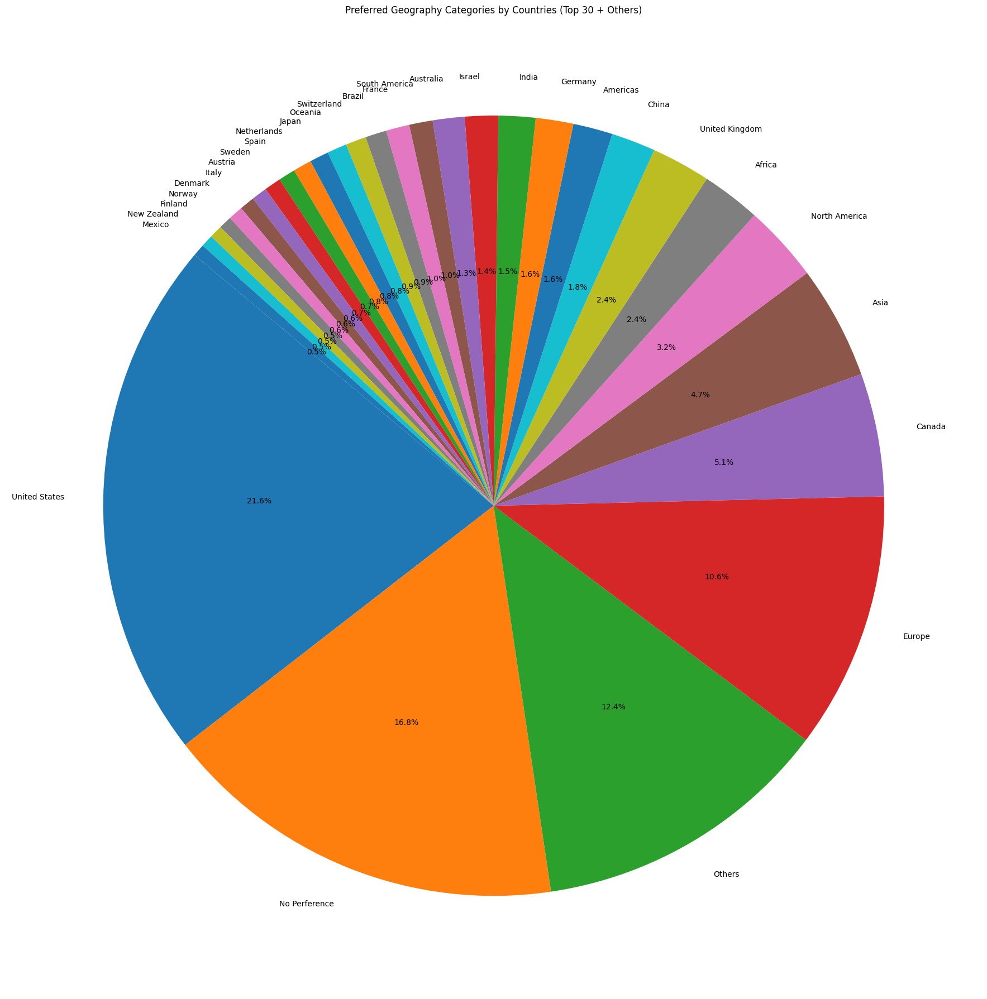

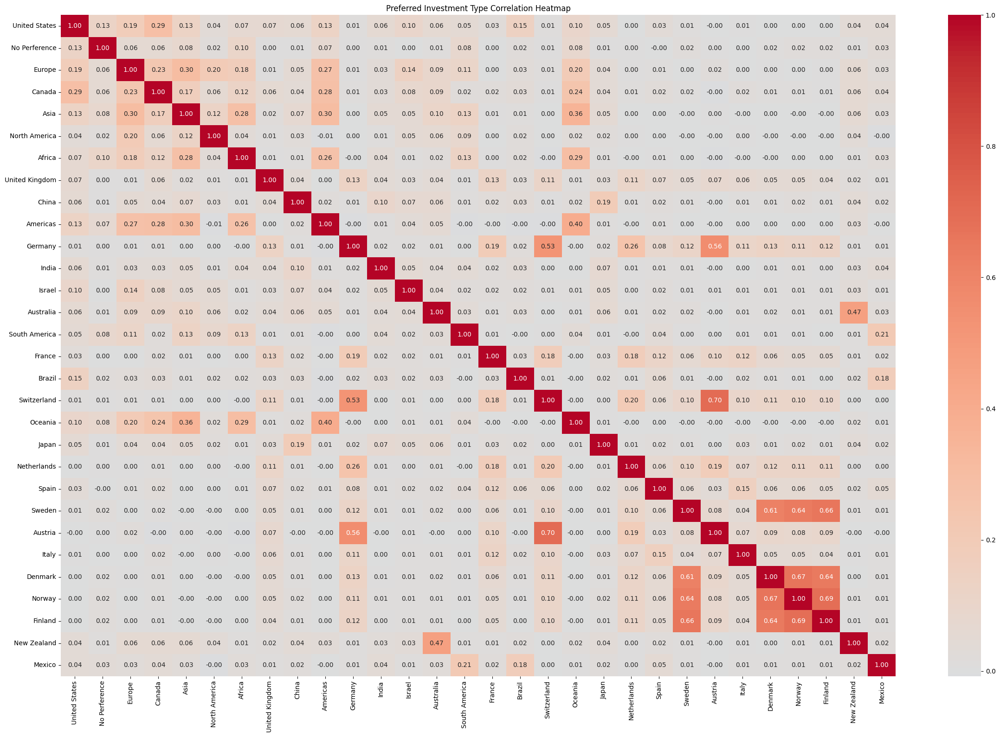

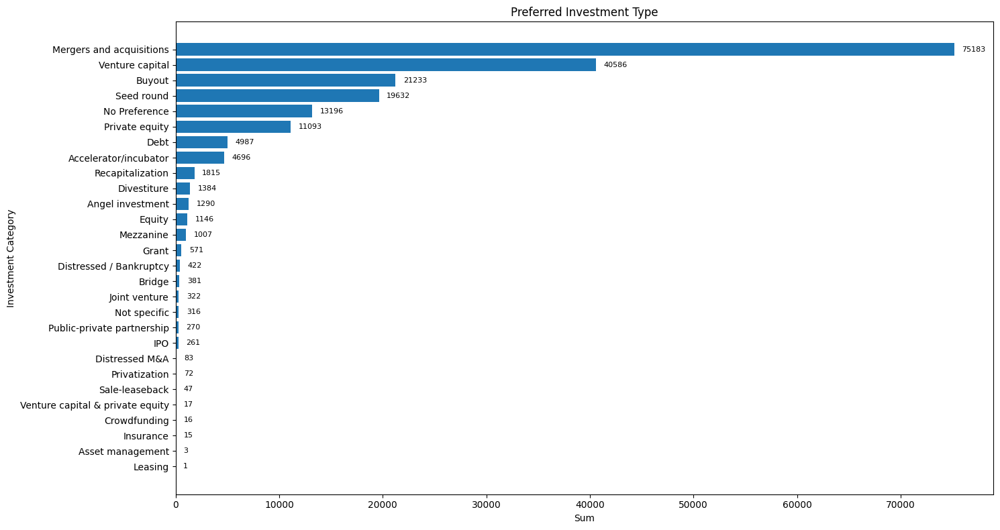

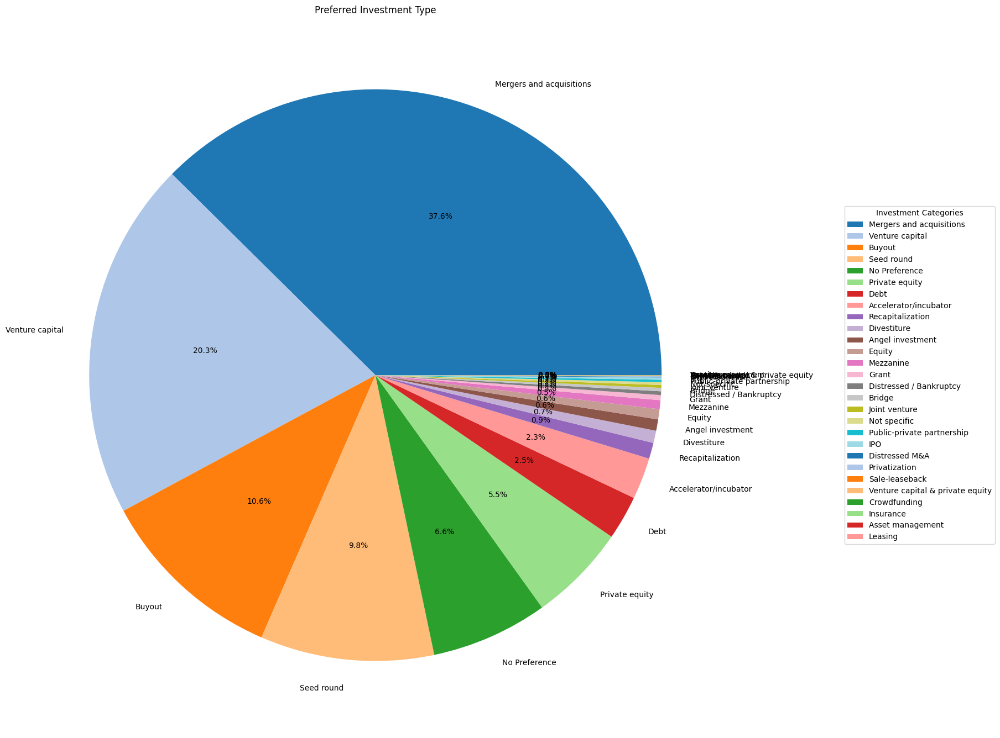

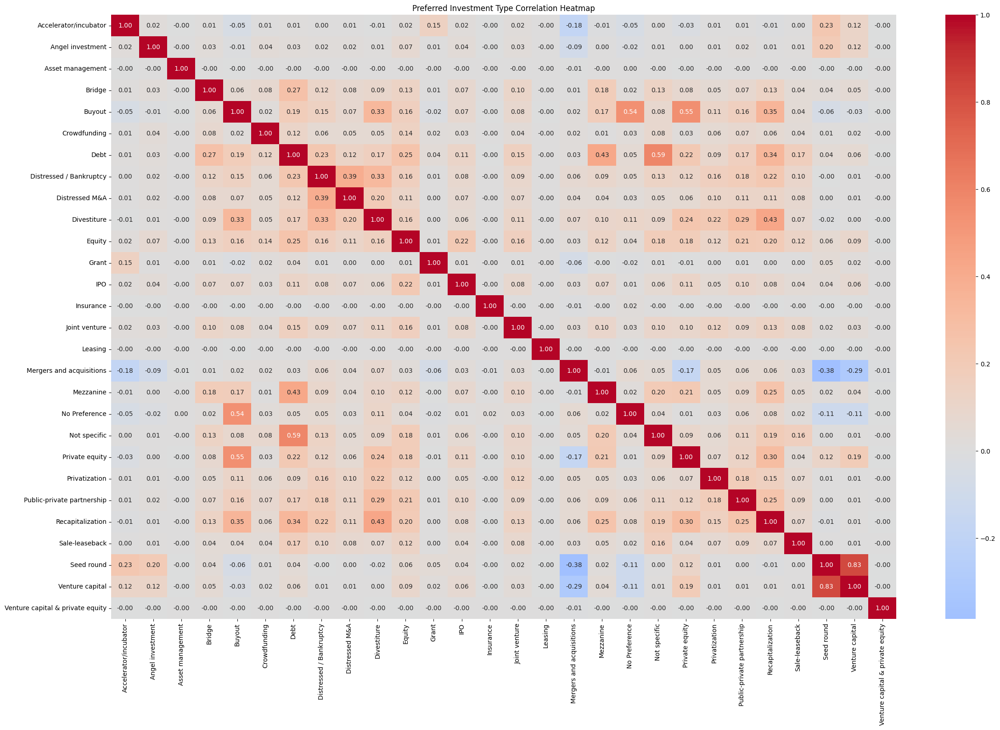

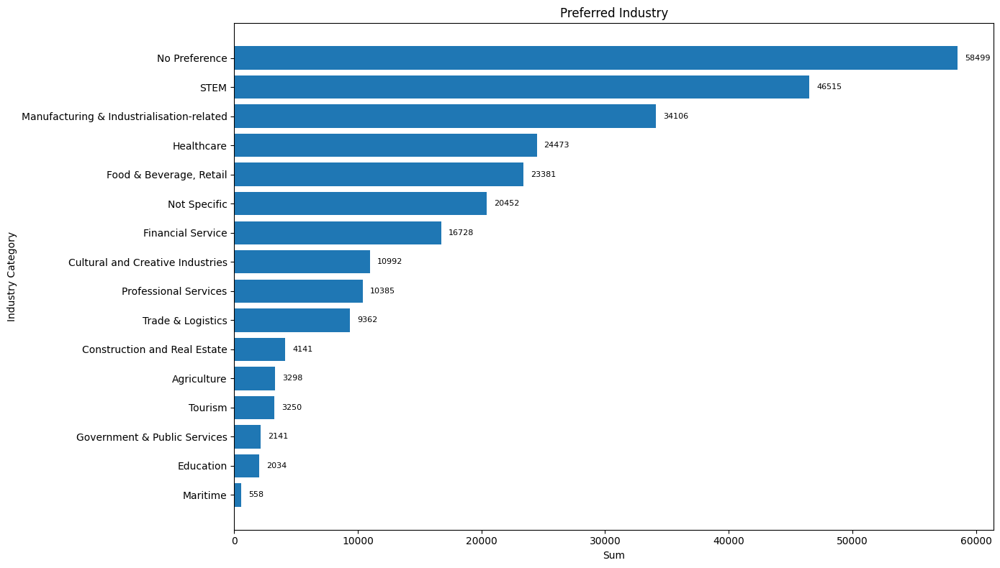

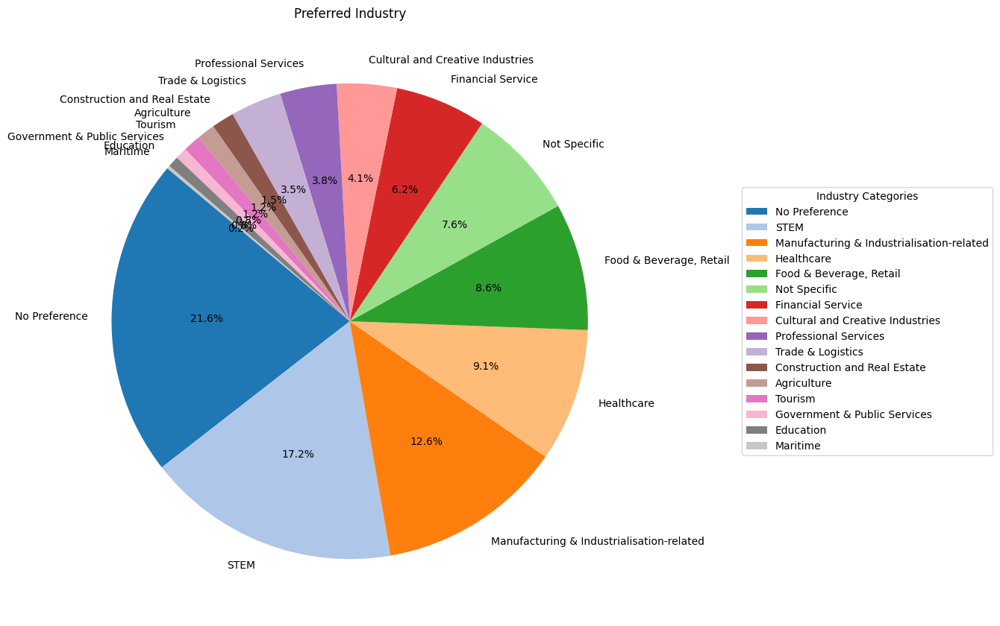

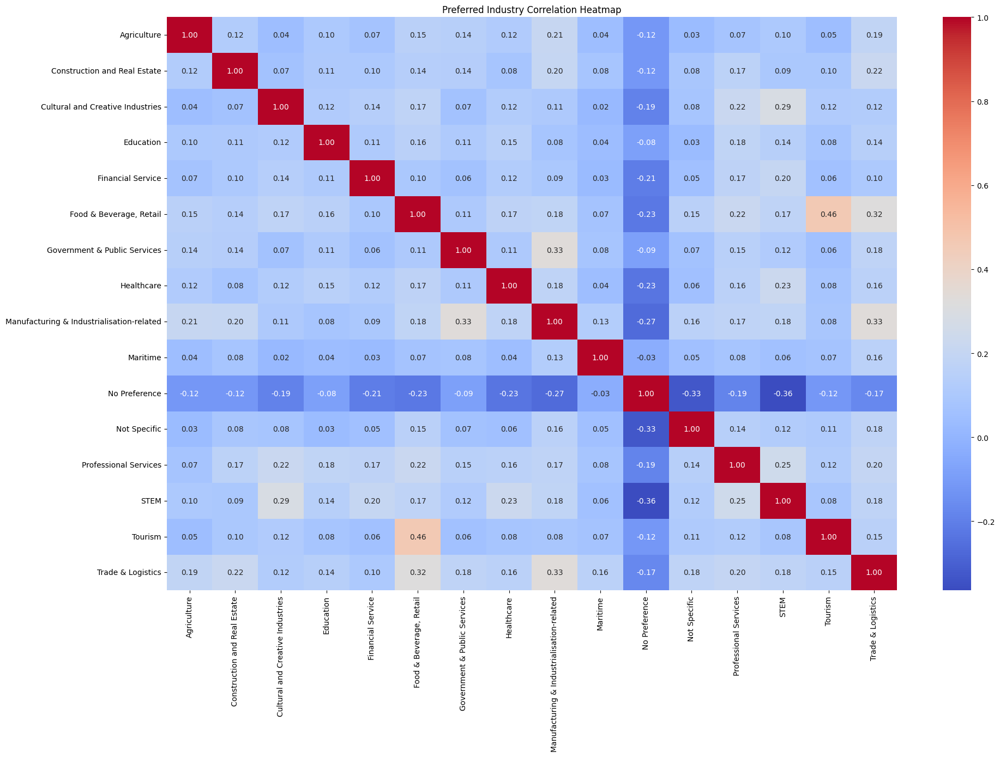

In [7]:
%run "EDA by Python.ipynb"

## SentenceTransformer Encoding

In [8]:
model = SentenceTransformer('all-MiniLM-L6-v2')

### Geography

In [9]:

geography_embeddings = model.encode(geography_count.geography_tags.tolist())

In [10]:
import umap.umap_ as umap

#Reduce dimensions using umap (good for large dataset)
umap_model = umap.UMAP(n_components=2, random_state=42)
geography_embeddings_umap = umap_model.fit_transform(geography_embeddings)
geography_embeddings_umap

# Combine geography_tags_list.index and geography_embeddings_umap into a DataFrame
geography_embeddings_umap_df = pd.DataFrame({
    'Geography': geography_count.geography_tags,
    'Dimension_1': [embedding[0] for embedding in geography_embeddings_umap],
    'Dimension_2': [embedding[1] for embedding in geography_embeddings_umap]
})
geography_embeddings_umap_df

geography_embeddings_umap_df

C:\Users\P\AppData\Roaming\Python\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\P\AppData\Roaming\Python\Python313\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


,Geography,Dimension_1,Dimension_2
1,united states,5.395320,0.534055
2,europe,5.426367,-1.581393
3,canada,5.066510,0.846951
4,north america,5.683842,0.648233
5,asia,8.095116,-4.060793
...,...,...,...
2907,turkmenistan,7.469229,-3.017312
3093,taiwan.,8.466375,-3.930458
3262,swaziland,5.403079,-2.381104
3586,florida.,3.728492,2.558641


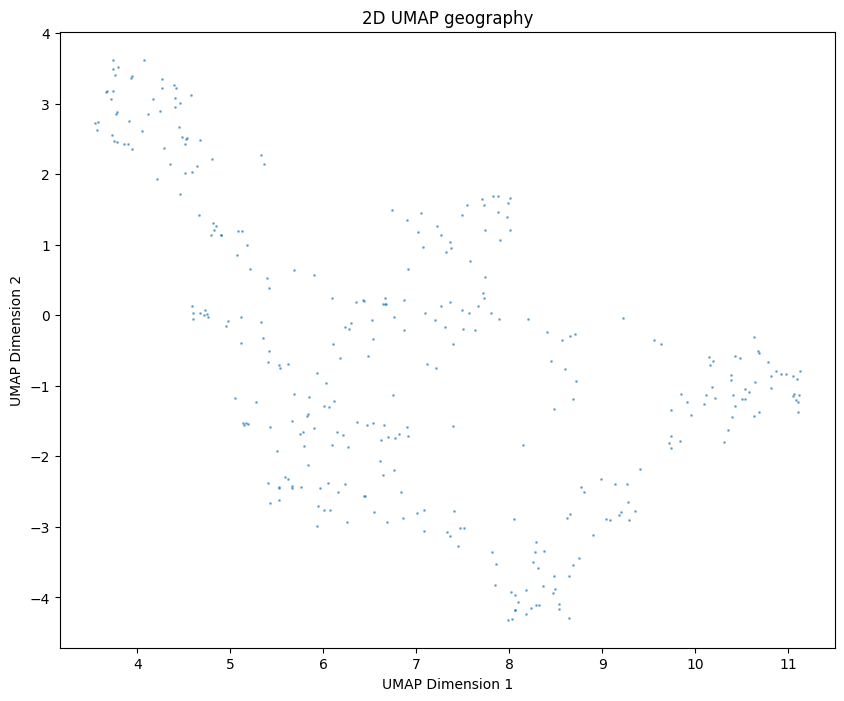

In [11]:
# fix. set the color 86160

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(geography_embeddings_umap_df['Dimension_1'], geography_embeddings_umap_df['Dimension_2'], s=1, alpha=0.5)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('2D UMAP geography')
plt.show()

### investment type

In [12]:
investment_type_count

,preferred_investment_type_tags,count,Investment Categories
0,merger/acquisition,72743,Mergers and acquisitions
2,early stage vc,22782,Venture capital
3,seed round,19632,Seed round
4,buyout/lbo,18816,Buyout
5,later stage vc,17734,Venture capital
...,...,...,...
237,multi-line insurance,1,Insurance
238,property and casualty insurance,1,Insurance
246,life and health insurance,1,Insurance
266,bank debt,1,Debt


In [13]:
investment_categories_count  = investment_type_count.groupby('Investment Categories')['count'].sum()
investment_categories_count

Investment Categories
Accelerator/incubator                4696
Angel investment                     1290
Asset management                        3
Bridge                                381
Buyout                              21233
Crowdfunding                           16
Debt                                 4987
Distressed / Bankruptcy               422
Distressed M&A                         83
Divestiture                          1384
Equity                               1146
Grant                                 571
IPO                                   261
Insurance                              15
Joint venture                         322
Leasing                                 1
Mergers and acquisitions            75183
Mezzanine                            1007
Private equity                      11093
Privatization                          72
Public-private partnership            270
Recapitalization                     1815
Sale-leaseback                         47
Seed round  

C:\Users\P\AppData\Roaming\Python\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\P\AppData\Roaming\Python\Python313\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


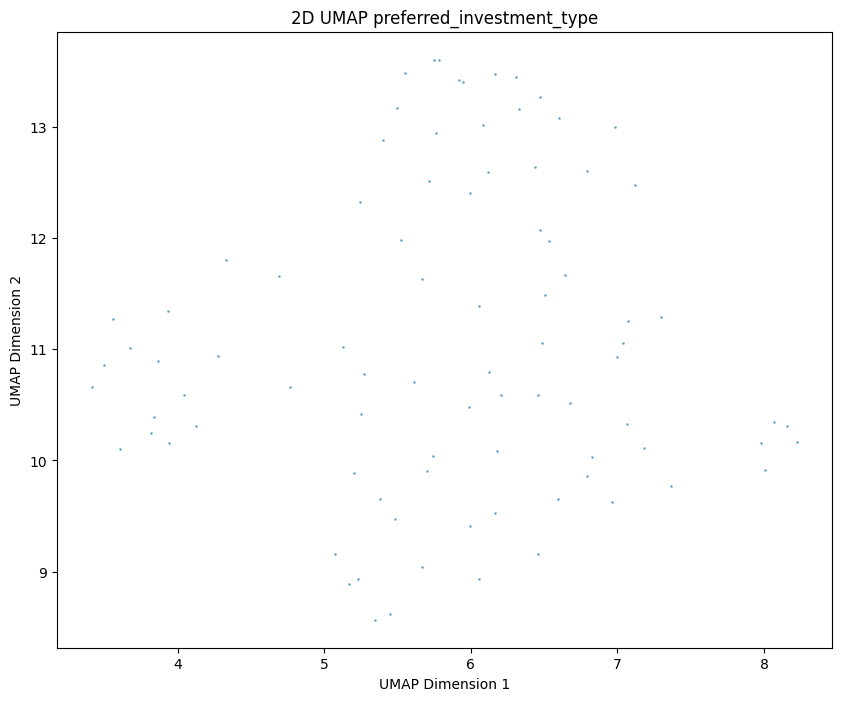

In [14]:
investment_type_embeddings = model.encode(investment_type_count.preferred_investment_type_tags.to_list())

umap_model = umap.UMAP(n_components=2, random_state=42)
investment_type_embeddings_umap = umap_model.fit_transform(investment_type_embeddings)

investment_type_embeddings_umap_df = pd.DataFrame({
    'investment_type': investment_type_count.preferred_investment_type_tags,
    'Dimension_1': [embedding[0] for embedding in investment_type_embeddings_umap],
    'Dimension_2': [embedding[1] for embedding in investment_type_embeddings_umap]
})

plt.figure(figsize=(10, 8))
plt.scatter(investment_type_embeddings_umap_df['Dimension_1'], investment_type_embeddings_umap_df['Dimension_2'], s=1, alpha=0.5)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('2D UMAP preferred_investment_type')
plt.show()

In [15]:
investment_type_embeddings_umap_df

,investment_type,Dimension_1,Dimension_2
0,merger/acquisition,7.039368,11.055219
2,early stage vc,4.120386,10.308330
3,seed round,3.676495,11.012844
4,buyout/lbo,5.378881,9.655716
5,later stage vc,3.836720,10.392241
...,...,...,...
237,multi-line insurance,8.159023,10.306576
238,property and casualty insurance,8.224063,10.164533
246,life and health insurance,8.065068,10.345859
266,bank debt,6.306308,13.451283


### preferred_industry

In [16]:
preferred_industry_categories_count = preferred_industry_count.groupby('industries categories')['count'].sum()
preferred_industry_categories_count

industries categories
Agriculture                                   3298
Construction and Real Estate                  4141
Cultural and Creative Industries             10992
Education                                     2034
Financial Service                            16728
Food & Beverage, Retail                      23381
Government & Public Services                  2141
Healthcare                                   24473
Manufacturing & Industrialisation-related    34106
Maritime                                       558
Professional Services                        10385
STEM                                         46515
Tourism                                       3250
Trade & Logistics                             9362
Name: count, dtype: int64

In [17]:
industry_list = preferred_industry_count.preferred_industry_tags.to_list()
industry_embeddings = model.encode(industry_list)

C:\Users\P\AppData\Roaming\Python\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\P\AppData\Roaming\Python\Python313\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\P\AppData\Roaming\Python\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\P\AppData\Roaming\Python\Python313\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\P\AppData\Local\Temp\ipykernel_56944\4148876030.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performan

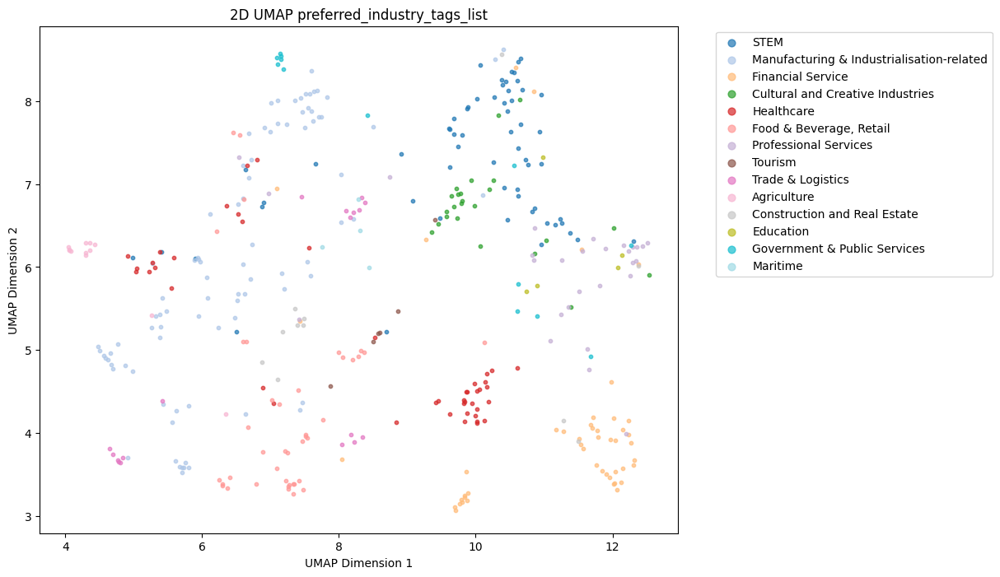

In [18]:
industry_embeddings


umap_model = umap.UMAP(n_components=2, random_state=42)
industry_embeddings_umap_2d = umap_model.fit_transform(industry_embeddings)

umap_model_3d = umap.UMAP(n_components=3, random_state=42)
industry_embeddings_umap_3d = umap_model_3d.fit_transform(industry_embeddings)

# Create a DataFrame with all 384 embedding dimensions for each industry, with industry/category/count columns first
industry_embeddings_umap_df = pd.DataFrame({
    'Industry': preferred_industry_count.preferred_industry_tags.values,
    'Category': preferred_industry_count['industries categories'].values,
    'Count': preferred_industry_count['count'].values
})
# Add embedding columns
for i in range(industry_embeddings.shape[1]):
    industry_embeddings_umap_df[f'embedding_{i}'] = industry_embeddings[:, i]

industry_embeddings_umap_df['2d_Dimension_1']= [embedding[0] for embedding in industry_embeddings_umap_2d]
industry_embeddings_umap_df['2d_Dimension_2']= [embedding[1] for embedding in industry_embeddings_umap_2d]
industry_embeddings_umap_df['3d_Dimension_1']= [embedding[0] for embedding in industry_embeddings_umap_3d]
industry_embeddings_umap_df['3d_Dimension_2']= [embedding[1] for embedding in industry_embeddings_umap_3d]
industry_embeddings_umap_df['3d_Dimension_3']= [embedding[2] for embedding in industry_embeddings_umap_3d]

plt.figure(figsize=(10, 8))
categories = industry_embeddings_umap_df['Category'].unique()
colors = plt.cm.get_cmap('tab20', len(categories))

for idx, category in enumerate(categories):
    subset = industry_embeddings_umap_df[industry_embeddings_umap_df['Category'] == category]
    plt.scatter(subset['2d_Dimension_1'], 
                subset['2d_Dimension_2'], 
                s=10, alpha=0.7, 
                label=category, 
                color=colors(idx))

plt.legend(markerscale=2, bbox_to_anchor=(1.05, 1), loc='upper left')



plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('2D UMAP preferred_industry_tags_list')
plt.show()



In [19]:
industry_embeddings_umap_df

,Industry,Category,Count,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,...,embedding_379,embedding_380,embedding_381,embedding_382,embedding_383,2d_Dimension_1,2d_Dimension_2,3d_Dimension_1,3d_Dimension_2,3d_Dimension_3
0,software,STEM,23058,-0.071273,0.022925,-0.014571,-0.039899,-0.020516,-0.051919,0.044214,...,0.055568,0.025446,-0.005229,0.078088,0.014576,10.396330,8.197595,7.053637,7.857065,2.703692
1,commercial products,Manufacturing & Industrialisation-related,7907,-0.032485,-0.024872,-0.000482,0.002792,0.032079,0.020750,0.084162,...,0.023445,-0.015926,-0.051797,0.116207,-0.008528,7.464218,4.367049,9.736180,5.006923,4.373499
2,other financial services,Financial Service,4705,-0.006406,-0.099743,-0.055705,0.000813,-0.013217,0.001551,0.053851,...,0.047965,0.029537,-0.115077,0.089820,0.045305,12.021041,4.180721,10.201722,7.413265,2.426548
3,media,Cultural and Creative Industries,4659,0.044520,0.011132,-0.013301,-0.024794,0.083836,0.052082,0.054593,...,0.035294,0.116821,0.019107,0.032248,0.088630,9.792860,6.765106,7.684776,7.481632,3.733621
4,healthcare,Healthcare,4515,-0.032356,0.088777,-0.003436,0.010857,-0.050009,0.049188,0.114996,...,0.040652,0.095689,-0.046973,0.080995,0.008606,9.998394,4.207816,10.686265,7.369542,4.621688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,automation.,STEM,1,-0.055695,0.011836,-0.021652,0.024139,-0.037079,-0.015743,0.065969,...,0.114355,0.059017,0.039848,0.083297,-0.017530,10.068860,8.438643,6.858060,7.431485,2.741043
398,mobile and wearable payments and cashless debi...,Financial Service,1,-0.076345,0.110419,0.000681,-0.009961,-0.007776,-0.006172,0.089594,...,0.022178,0.049606,-0.086426,0.045827,-0.030715,12.316737,3.673079,10.377419,7.253169,1.934295
399,digital channels,STEM,1,0.013301,-0.096319,-0.050905,-0.080083,-0.061154,-0.008069,0.073934,...,0.090403,-0.061700,0.044421,-0.054150,-0.034663,9.616140,7.205592,7.222080,7.802799,3.912942
400,mobile services south asia,STEM,1,-0.084453,0.045121,-0.021181,-0.091805,-0.015843,-0.015034,-0.021970,...,0.111195,0.022795,-0.034808,-0.035042,0.010176,10.954174,7.240909,7.804307,8.581860,3.816040


In [20]:
fig = px.scatter(
    industry_embeddings_umap_df,
    x="2d_Dimension_1",
    y="2d_Dimension_2",
    color="Category",
    hover_data=["Industry", "Count"]
)
fig.show()


# Should enable

In [22]:


# fig = px.scatter_3d(
#     industry_embeddings_umap_df, 
#     x="3d_Dimension_1", 
#     y="3d_Dimension_2", 
#     z="3d_Dimension_3",
#     hover_data=['Industry'],
#     color='Category'
# )
# fig.show()
# html_str = fig.to_html()
# with open('industry_umap_3d.html', 'w') as f:
#     f.write(html_str)

# fig = px.scatter_3d(industry_embeddings_umap_df,
#                      x="3d_Dimension_1", 
#                      y="3d_Dimension_2", 
#                      z="3d_Dimension_3",
#                      hover_data='Industry',
#                      size='Count',
#                      color='Category'
# # , color="species",size='petal_length'
#                     )
# fig.show()
# html_str = fig.to_html()
# with open('industry_umap_3d_size.html', 'w') as f:
#     f.write(html_str)

## ML - Clustering

In [23]:
from sklearn.cluster import KMeans

### Geography Clustering 

In [24]:
geography_embeddings_umap_df

,Geography,Dimension_1,Dimension_2
1,united states,5.395320,0.534055
2,europe,5.426367,-1.581393
3,canada,5.066510,0.846951
4,north america,5.683842,0.648233
5,asia,8.095116,-4.060793
...,...,...,...
2907,turkmenistan,7.469229,-3.017312
3093,taiwan.,8.466375,-3.930458
3262,swaziland,5.403079,-2.381104
3586,florida.,3.728492,2.558641


In [25]:
n_clusters = 7
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
geography_embeddings_umap_df['Cluster row'] = kmeans.fit_predict(
    geography_embeddings_umap_df[['Dimension_1', 'Dimension_2']]
)

geography_embeddings_umap_df

,Geography,Dimension_1,Dimension_2,Cluster row
1,united states,5.395320,0.534055,1
2,europe,5.426367,-1.581393,3
3,canada,5.066510,0.846951,1
4,north america,5.683842,0.648233,1
5,asia,8.095116,-4.060793,2
...,...,...,...,...
2907,turkmenistan,7.469229,-3.017312,2
3093,taiwan.,8.466375,-3.930458,2
3262,swaziland,5.403079,-2.381104,3
3586,florida.,3.728492,2.558641,5


Find the optimal number of K for K-means using Elbow Method

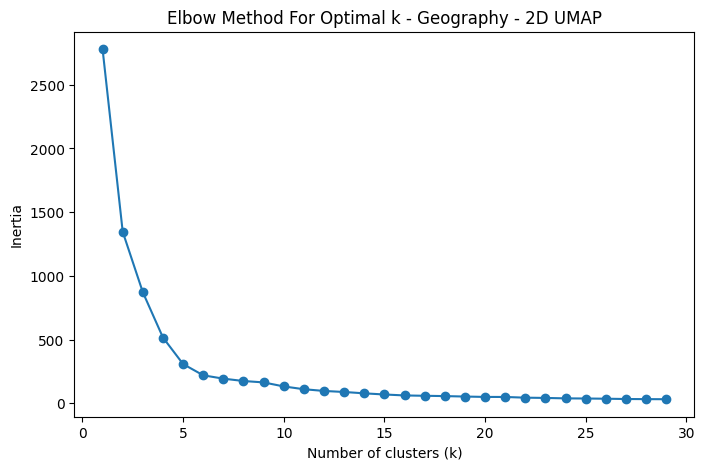

In [26]:
inertias = []
cluster_range = range(1, 30, 1)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( geography_embeddings_umap_df[['Dimension_1', 'Dimension_2']] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Geography - 2D UMAP')
plt.show()

### Investment Clustering 

In [27]:
investment_type_embeddings_umap_df

,investment_type,Dimension_1,Dimension_2
0,merger/acquisition,7.039368,11.055219
2,early stage vc,4.120386,10.308330
3,seed round,3.676495,11.012844
4,buyout/lbo,5.378881,9.655716
5,later stage vc,3.836720,10.392241
...,...,...,...
237,multi-line insurance,8.159023,10.306576
238,property and casualty insurance,8.224063,10.164533
246,life and health insurance,8.065068,10.345859
266,bank debt,6.306308,13.451283


In [28]:
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
investment_type_embeddings_umap_df['Cluster row'] = kmeans.fit_predict(
    investment_type_embeddings_umap_df[['Dimension_1', 'Dimension_2']]
)

investment_type_embeddings_umap_df

,investment_type,Dimension_1,Dimension_2,Cluster row
0,merger/acquisition,7.039368,11.055219,3
2,early stage vc,4.120386,10.308330,2
3,seed round,3.676495,11.012844,2
4,buyout/lbo,5.378881,9.655716,4
5,later stage vc,3.836720,10.392241,2
...,...,...,...,...
237,multi-line insurance,8.159023,10.306576,9
238,property and casualty insurance,8.224063,10.164533,9
246,life and health insurance,8.065068,10.345859,9
266,bank debt,6.306308,13.451283,0


Find the optimal number of K for K-means using Elbow Method

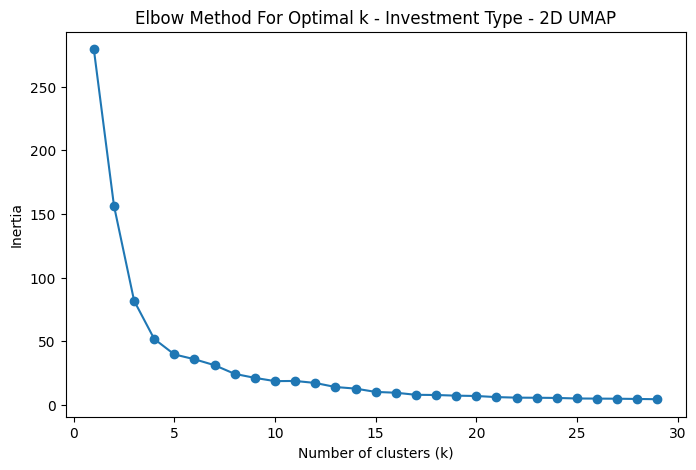

In [29]:
inertias = []
cluster_range = range(1, 30, 1)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( investment_type_embeddings_umap_df[['Dimension_1', 'Dimension_2']] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Investment Type - 2D UMAP')
plt.show()

### Industry Clustering 

In [30]:
industry_embeddings_umap_df

,Industry,Category,Count,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,...,embedding_379,embedding_380,embedding_381,embedding_382,embedding_383,2d_Dimension_1,2d_Dimension_2,3d_Dimension_1,3d_Dimension_2,3d_Dimension_3
0,software,STEM,23058,-0.071273,0.022925,-0.014571,-0.039899,-0.020516,-0.051919,0.044214,...,0.055568,0.025446,-0.005229,0.078088,0.014576,10.396330,8.197595,7.053637,7.857065,2.703692
1,commercial products,Manufacturing & Industrialisation-related,7907,-0.032485,-0.024872,-0.000482,0.002792,0.032079,0.020750,0.084162,...,0.023445,-0.015926,-0.051797,0.116207,-0.008528,7.464218,4.367049,9.736180,5.006923,4.373499
2,other financial services,Financial Service,4705,-0.006406,-0.099743,-0.055705,0.000813,-0.013217,0.001551,0.053851,...,0.047965,0.029537,-0.115077,0.089820,0.045305,12.021041,4.180721,10.201722,7.413265,2.426548
3,media,Cultural and Creative Industries,4659,0.044520,0.011132,-0.013301,-0.024794,0.083836,0.052082,0.054593,...,0.035294,0.116821,0.019107,0.032248,0.088630,9.792860,6.765106,7.684776,7.481632,3.733621
4,healthcare,Healthcare,4515,-0.032356,0.088777,-0.003436,0.010857,-0.050009,0.049188,0.114996,...,0.040652,0.095689,-0.046973,0.080995,0.008606,9.998394,4.207816,10.686265,7.369542,4.621688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,automation.,STEM,1,-0.055695,0.011836,-0.021652,0.024139,-0.037079,-0.015743,0.065969,...,0.114355,0.059017,0.039848,0.083297,-0.017530,10.068860,8.438643,6.858060,7.431485,2.741043
398,mobile and wearable payments and cashless debi...,Financial Service,1,-0.076345,0.110419,0.000681,-0.009961,-0.007776,-0.006172,0.089594,...,0.022178,0.049606,-0.086426,0.045827,-0.030715,12.316737,3.673079,10.377419,7.253169,1.934295
399,digital channels,STEM,1,0.013301,-0.096319,-0.050905,-0.080083,-0.061154,-0.008069,0.073934,...,0.090403,-0.061700,0.044421,-0.054150,-0.034663,9.616140,7.205592,7.222080,7.802799,3.912942
400,mobile services south asia,STEM,1,-0.084453,0.045121,-0.021181,-0.091805,-0.015843,-0.015034,-0.021970,...,0.111195,0.022795,-0.034808,-0.035042,0.010176,10.954174,7.240909,7.804307,8.581860,3.816040


In [31]:
# Choose the number of clusters, e.g., 5
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
industry_embeddings_umap_df['Cluster_2d_KMeans'] = kmeans.fit_predict(
    industry_embeddings_umap_df[['2d_Dimension_1', '2d_Dimension_2']]
)

industry_embeddings_umap_df

# Choose the number of clusters, e.g., 5
n_clusters = 7
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
industry_embeddings_umap_df['Cluster_3d_KMeans'] = kmeans.fit_predict(
    industry_embeddings_umap_df[['3d_Dimension_1', '3d_Dimension_2', '3d_Dimension_3']]
)

industry_embeddings_umap_df


# Choose the number of clusters, e.g., 5
n_clusters = 350
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
industry_embeddings_umap_df['Cluster_384d_KMeans'] = kmeans.fit_predict(
    industry_embeddings_umap_df[list([col for col in industry_embeddings_umap_df.columns if col.startswith('embedding_')])]
)



industry_embeddings_umap_df



C:\Users\P\AppData\Local\Temp\ipykernel_56944\3977002511.py:4: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\P\AppData\Local\Temp\ipykernel_56944\3977002511.py:13: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\P\AppData\Local\Temp\ipykernel_56944\3977002511.py:23: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use

,Industry,Category,Count,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,...,embedding_382,embedding_383,2d_Dimension_1,2d_Dimension_2,3d_Dimension_1,3d_Dimension_2,3d_Dimension_3,Cluster_2d_KMeans,Cluster_3d_KMeans,Cluster_384d_KMeans
0,software,STEM,23058,-0.071273,0.022925,-0.014571,-0.039899,-0.020516,-0.051919,0.044214,...,0.078088,0.014576,10.396330,8.197595,7.053637,7.857065,2.703692,1,1,272
1,commercial products,Manufacturing & Industrialisation-related,7907,-0.032485,-0.024872,-0.000482,0.002792,0.032079,0.020750,0.084162,...,0.116207,-0.008528,7.464218,4.367049,9.736180,5.006923,4.373499,2,5,96
2,other financial services,Financial Service,4705,-0.006406,-0.099743,-0.055705,0.000813,-0.013217,0.001551,0.053851,...,0.089820,0.045305,12.021041,4.180721,10.201722,7.413265,2.426548,4,3,11
3,media,Cultural and Creative Industries,4659,0.044520,0.011132,-0.013301,-0.024794,0.083836,0.052082,0.054593,...,0.032248,0.088630,9.792860,6.765106,7.684776,7.481632,3.733621,1,1,101
4,healthcare,Healthcare,4515,-0.032356,0.088777,-0.003436,0.010857,-0.050009,0.049188,0.114996,...,0.080995,0.008606,9.998394,4.207816,10.686265,7.369542,4.621688,4,4,298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,automation.,STEM,1,-0.055695,0.011836,-0.021652,0.024139,-0.037079,-0.015743,0.065969,...,0.083297,-0.017530,10.068860,8.438643,6.858060,7.431485,2.741043,1,1,83
398,mobile and wearable payments and cashless debi...,Financial Service,1,-0.076345,0.110419,0.000681,-0.009961,-0.007776,-0.006172,0.089594,...,0.045827,-0.030715,12.316737,3.673079,10.377419,7.253169,1.934295,4,3,95
399,digital channels,STEM,1,0.013301,-0.096319,-0.050905,-0.080083,-0.061154,-0.008069,0.073934,...,-0.054150,-0.034663,9.616140,7.205592,7.222080,7.802799,3.912942,1,1,227
400,mobile services south asia,STEM,1,-0.084453,0.045121,-0.021181,-0.091805,-0.015843,-0.015034,-0.021970,...,-0.035042,0.010176,10.954174,7.240909,7.804307,8.581860,3.816040,1,1,156


Find the optimal number of K for K-means using Elbow Method

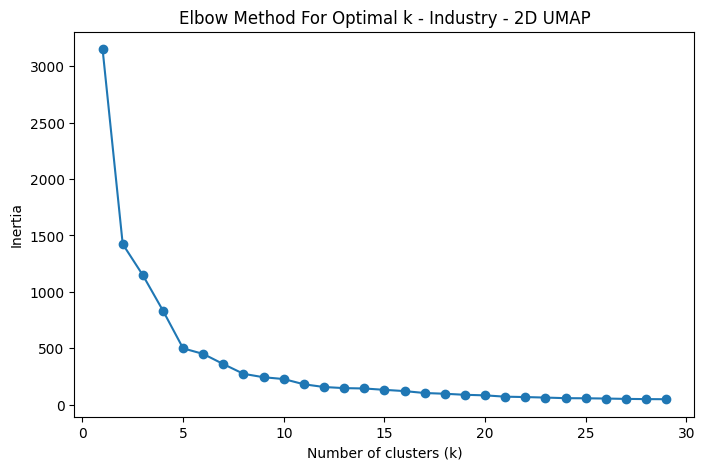

In [32]:
inertias = []
cluster_range = range(1, 30, 1)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( industry_embeddings_umap_df[['2d_Dimension_1', '2d_Dimension_2']] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Industry - 2D UMAP')
plt.show()

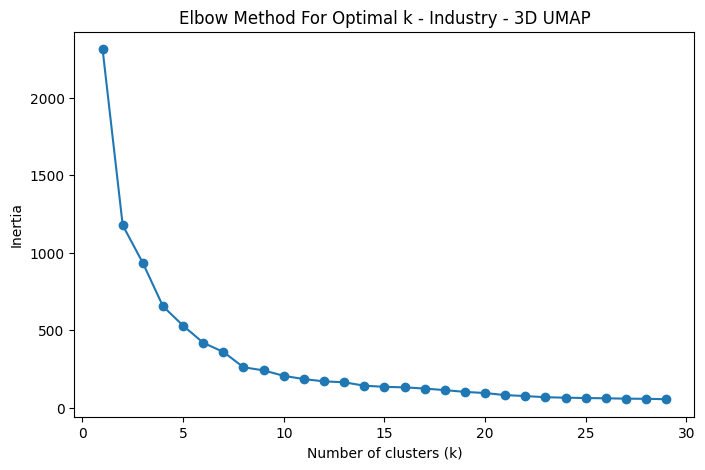

In [33]:
inertias = []
cluster_range = range(1, 30, 1)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( industry_embeddings_umap_df[['3d_Dimension_1', '3d_Dimension_2', '3d_Dimension_3']] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Industry - 3D UMAP')
plt.show()

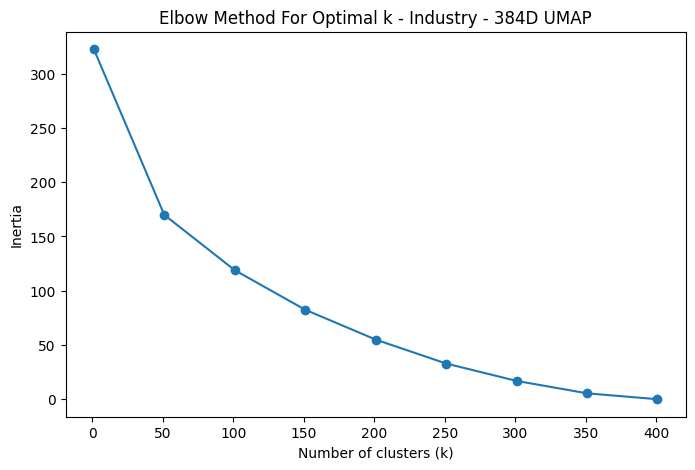

In [34]:
inertias = []
cluster_range = range(1, 450, 50)
for k in cluster_range:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias.append(
        kmeans_tmp.fit( industry_embeddings_umap_df[list([col for col in industry_embeddings_umap_df.columns if col.startswith('embedding_')])] ).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - Industry - 384D UMAP')
plt.show()

#### 2d

In [35]:
fig = px.scatter(
    industry_embeddings_umap_df,
    x="2d_Dimension_1",
    y="2d_Dimension_2",
    color="Cluster_2d_KMeans",
    hover_data=["Industry", "Count"],
)
fig.show()
# fig = px.scatter(
#     industry_embeddings_umap_df,
#     x="2d_Dimension_1",
#     y="2d_Dimension_2",
#     color="Cluster_3d_KMeans",
#     hover_data=["Industry", "Count"],
    
# )

# fig.show()

In [36]:
fig = px.scatter(
    industry_embeddings_umap_df,
    x="2d_Dimension_1",
    y="2d_Dimension_2",
    color="Cluster_384d_KMeans",
    hover_data=["Industry", "Count"],
)
fig.show()


#### 3d

# Should Enable

In [57]:
# fig = px.scatter_3d(
#     industry_embeddings_umap_df, 
#     x="3d_Dimension_1", 
#     y="3d_Dimension_2", 
#     z="3d_Dimension_3",
#     hover_data=['Industry'],
#     color='Cluster_2d_KMeans'
# )
# fig.show()
# html_str = fig.to_html()
# with open('industry_umap_3d.html', 'w') as f:
#     f.write(html_str)

# fig = px.scatter_3d(industry_embeddings_umap_df,
#                      x="3d_Dimension_1", 
#                      y="3d_Dimension_2", 
#                      z="3d_Dimension_3",
#                      hover_data='Industry',
#                      size='Count',
#                      color='Cluster_3d_KMeans'
# # , color="species",size='petal_length'
#                     )
# fig.show()
# html_str = fig.to_html()
# with open('industry_umap_3d_size.html', 'w') as f:
#     f.write(html_str)

    


# fig = px.scatter_3d(
#     industry_embeddings_umap_df, 
#     x="3d_Dimension_1", 
#     y="3d_Dimension_2", 
#     z="3d_Dimension_3",
#     hover_data=['Industry'],
#     color='Cluster_384d_KMeans'
# )
# fig.show()
# html_str = fig.to_html()
# with open('industry_umap_384d.html', 'w') as f:
#     f.write(html_str)

In [58]:
industry_embeddings_umap_df.sort_values(by='Cluster_384d_KMeans', ascending=False)

,Industry,Category,Count,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,embedding_100,embedding_101,embedding_102,embedding_103,embedding_104,embedding_105,embedding_106,embedding_107,embedding_108,embedding_109,embedding_110,embedding_111,embedding_112,embedding_113,embedding_114,embedding_115,embedding_116,embedding_117,embedding_118,embedding_119,embedding_120,embedding_121,embedding_122,embedding_123,embedding_124,...,embedding_264,embedding_265,embedding_266,embedding_267,embedding_268,embedding_269,embedding_270,embedding_271,embedding_272,embedding_273,embedding_274,embedding_275,embedding_276,embedding_277,embedding_278,embedding_279,embedding_280,embedding_281,embedding_282,embedding_283,embedding_284,embedding_285,embedding_286,embedding_287,embedding_288,embedding_289,embedding_290,embedding_291,embedding_292,embedding_293,embedding_294,embedding_295,embedding_296,embedding_297,embedding_298,embedding_299,embedding_300,embedding_301,embedding_302,embedding_303,embedding_304,embedding_305,embedding_306,embedding_307,embedding_308,embedding_309,embedding_310,embedding_311,embedding_312,embedding_313,embedding_314,embedding_315,embedding_316,embedding_317,embedding_318,embedding_319,embedding_320,embedding_321,embedding_322,embedding_323,embedding_324,embedding_325,embedding_326,embedding_327,embedding_328,embedding_329,embedding_330,embedding_331,embedding_332,embedding_333,embedding_334,embedding_335,embedding_336,embedding_337,embedding_338,embedding_339,embedding_340,embedding_341,embedding_342,embedding_343,embedding_344,embedding_345,embedding_346,embedding_347,embedding_348,embedding_349,embedding_350,embedding_351,embedding_352,embedding_353,embedding_354,embedding_355,embedding_356,embedding_357,embedding_358,embedding_359,embedding_360,embedding_361,embedding_362,embedding_363,embedding_364,embedding_365,embedding_366,embedding_367,embedding_368,embedding_369,embedding_370,embedding_371,embedding_372,embedding_373,embedding_374,embedding_375,embedding_376,embedding_377,embedding_378,embedding_379,embedding_380,embedding_381,embedding_382,embedding_383,2d_Dimension_1,2d_Dimension_2,3d_Dimension_1,3d_Dimension_2,3d_Dimension_3,Cluster_2d_KMeans,Cluster_3d_KMeans,Cluster_384d_KMeans
283,government administration,Government & Public Services,3,-0.056722,-0.043253,0.015483,0.034755,-0.042314,-0.014000,0.070674,0.006128,-0.017145,0.086046,0.004536,-0.025871,-0.002737,-0.045528,-0.010351,-0.024836,-0.011511,-0.004737,-0.088347,-0.076714,0.034379,0.033345,-0.041851,0.000125,-0.058650,0.058678,-0.113363,-0.022104,-0.005531,-0.057151,0.014641,-0.041322,0.047098,0.007034,0.010929,0.063476,0.029183,-0.033962,0.085068,-0.040370,-0.020189,-0.030238,0.022925,-0.068324,-0.018518,0.005889,0.037915,-0.008886

Recommendation of ( Geography, Investment Type, Industry) based on K-means clustering result, since investor may choose one of those.

* geography

In [59]:
geography_cluster_group = geography_embeddings_umap_df.groupby('Cluster row')['Geography'].apply(list)
print( geography_cluster_group )
geography_cluster_group.to_csv('tags_geography_by_cluster.csv')

Cluster row
0    [africa, northern africa, eastern africa, sout...
1    [united states, canada, north america, united ...
2    [asia, india, israel, china, southeast asia, j...
3    [europe, germany, france, western europe, swit...
4    [south america, brazil, mexico, colombia, chil...
5    [california, new york, texas, florida, souther...
6    [oceania, us territories, hawaii, saint lucia,...
Name: Geography, dtype: object


* ivnestment type

In [60]:
investment_cluster_group = investment_type_embeddings_umap_df.groupby('Cluster row')['investment_type'].apply(list)
print( investment_cluster_group )
investment_cluster_group.to_csv('tags_investment_by_cluster.csv')

Cluster row
0    [senior debt, subordinated debt, secured debt,...
1    [public to private, equity for service, equity...
2    [early stage vc, seed round, later stage vc, a...
3    [merger/acquisition, acquisition financing, as...
4    [buyout/lbo, secondary transaction - private, ...
5    [debt - general, convertible debt, capitalizat...
6    [loan, grant, bridge, leveraged recapitalizati...
7    [corporate divestiture, joint venture, asset d...
8    [pe growth/expansion, management buyout, manag...
9    [insurance, other insurance, multi-line insura...
Name: investment_type, dtype: object


* industry

In [61]:
industry_cluster_group = industry_embeddings_umap_df.groupby('Cluster_2d_KMeans')['Industry'].apply(list)
print( industry_cluster_group )
industry_cluster_group.to_csv('tags_industry_by_cluster.csv')

Cluster_2d_KMeans
0    [pharmaceuticals and biotechnology, agricultur...
1    [software, media, information technology, it s...
2    [commercial products, retail, consumer non-dur...
3    [healthcare devices and supplies, energy, tran...
4    [other financial services, healthcare, financi...
Name: Industry, dtype: object


### Record Clustering --> List of Investors in Cluster and their Main Preference in 3 Tags

In [62]:
pd.set_option('display.max_columns', 257)
print(dataset_encoded_3.columns.tolist())

['Investors', 'Description', 'Geography', 'Preferred Industry', 'Preferred Investment Type', 'Primary Investor Type', 'geography_tags', 'preferred_investment_type_tags', 'preferred_industry_tags', 'Geography Categories_by countries_Afghanistan', 'Geography Categories_by countries_Africa', 'Geography Categories_by countries_Africa And Other Regions', 'Geography Categories_by countries_Albania', 'Geography Categories_by countries_Algeria', 'Geography Categories_by countries_Americas', 'Geography Categories_by countries_Andorra', 'Geography Categories_by countries_Angola', 'Geography Categories_by countries_Antigua and Barbuda', 'Geography Categories_by countries_Argentina', 'Geography Categories_by countries_Armenia', 'Geography Categories_by countries_Aruba', 'Geography Categories_by countries_Asia', 'Geography Categories_by countries_Australia', 'Geography Categories_by countries_Austria', 'Geography Categories_by countries_Azerbaijan', 'Geography Categories_by countries_Bahamas', 'Geo

In [63]:
exclude_cols = [
    'Investors',
    'Description',
    'Geography',
    'Preferred Industry',
    'Preferred Investment Type',
    'geography_tags',
    'preferred_investment_type_tags',
    'preferred_industry_tags',
    'Primary Investor Type'
]


In [64]:

n_clusters = 40
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
org_cols = [
    'Investors',
    'Description',
    'Geography',
    'Preferred Industry',
    'Preferred Investment Type',
    'geography_tags',
    'preferred_investment_type_tags',
    'preferred_industry_tags',
    'Primary Investor Type'
]
dataset_encoded_3_cluster = dataset_encoded_3.copy()
dataset_encoded_3_cluster['Cluster_row'] = kmeans.fit_predict(
    dataset_encoded_3_cluster[[col for col in dataset_encoded_3_cluster.columns if col not in org_cols] ]
)
dataset_encoded_3_cluster

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

Find the optimal number of K for K-means using Elbow Method --> k = 40

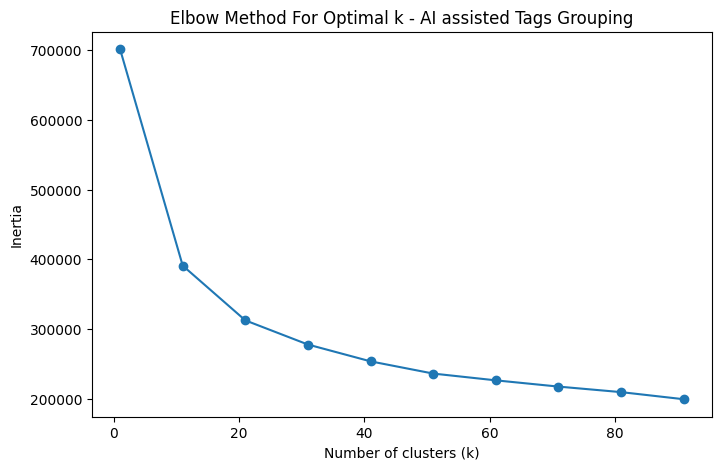

In [65]:
inertias_record_cluster = []
cluster_range_record_cluster = range(1, 100, 10)
for k in cluster_range_record_cluster:
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)
    inertias_record_cluster.append(
        kmeans_tmp.fit(dataset_encoded_3[[col for col in dataset_encoded_3.columns if col not in org_cols]]).inertia_
    )

plt.figure(figsize=(8, 5))
plt.plot(cluster_range_record_cluster, inertias_record_cluster, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k - AI assisted Tags Grouping')
plt.show()

List of Investors in the same cluster

In [66]:
investors_by_cluster = dataset_encoded_3_cluster.groupby('Cluster_row')['Investors'].apply(list)
print( investors_by_cluster)
investors_by_cluster.to_csv('investors_by_cluster.csv')

Cluster_row
0     [The Carlyle Group (NAS: CG), TA Associates Ma...
1     [Wallonie Entreprendre, Alliance Automotive Gr...
2     [Altas Partners, Novo Holdings, Sandeep Nailwa...
3     [Soma Capital, Precursor Ventures, Index Ventu...
4     [Tech Incubator Program for Startups, National...
5     [Animoca Brands, Rubicon Technology Partners, ...
6     [National Institutes of Health, Redesign Healt...
7     [Bpifrance, University of Toronto Entrepreneur...
8     [CVC Capital Partners (AMS: CVC), IndieBio, Br...
9     [Ares Management (NYS: ARES), BGF (Financial S...
10    [EQT (STO: EQT), Impact Assets, Intermediate C...
11    [Goldman Sachs Asset Management, MassChallenge...
12    [US LBM Holdings, Beacon Roofing Supply (NAS: ...
13    [Gaingels, Alumni Ventures, Pioneer Fund, gene...
14    [BlackRock (NYS: BLK), Bossa Invest, CPP Inves...
15    [Leonard Green &amp, Shore Capital Partners, M...
16    [Volaris Group, Cox Enterprises, Isengard Capi...
17    [J2 Partners, Jack Lingo Asset

#### Find the main preference (Geography, Investment Types or Industries) of each cluster.  

In [67]:
dataset_encoded_3_cluster[[col for col in dataset_encoded_3_cluster.columns if col not in org_cols] ]

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geo

group by each cluster and find their mean value by column

In [68]:
record_cluster = dataset_encoded_3_cluster[[col for col in dataset_encoded_3_cluster.columns if col not in org_cols] ].groupby('Cluster_row').mean().sort_values(by='Cluster_row', ascending=True)
record_cluster

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geo

In [69]:
record_cluster_geography = record_cluster.loc[:,'Geography Categories_by countries_Afghanistan':'Geography Categories_by countries_Zimbabwe']
record_cluster_ivnestment = record_cluster.loc[:,'Investment Categories_Accelerator/incubator':'Investment Categories_Venture capital & private equity']
record_cluster_industry = record_cluster.loc[:,'industries categories_Agriculture':'industries categories_Trade & Logistics']

Cluster main preference in Geography, Investment, Industry by Top 3

In [70]:
def top_3_values(row):
   return row.nlargest(3)

top_3_cluster_geography = record_cluster_geography.apply(top_3_values, axis=1)
top_3_cluster_investment = record_cluster_ivnestment.apply(top_3_values, axis=1)
top_3_cluster_industry = record_cluster_industry.apply(top_3_values, axis=1)

top_3_cluster_industry

,industries categories_Construction and Real Estate,industries categories_Cultural and Creative Industries,industries categories_Education,industries categories_Financial Service,"industries categories_Food & Beverage, Retail",industries categories_Healthcare,industries categories_Manufacturing & Industrialisation-related,industries categories_Maritime,industries categories_Not Relevant,industries categories_Not Specific,industries categories_Professional Services,industries categories_STEM,industries categories_Tourism,industries categories_Trade & Logistics
Cluster_row,,,,,,,,,,,,,,
0,NaN,NaN,NaN,NaN,NaN,0.685477,0.879668,NaN,NaN,NaN,NaN,1.048963,NaN,NaN
1,0.000613,NaN,NaN,0.000988,NaN,NaN,NaN,NaN,1.000068,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,0.000489,NaN,NaN,NaN,0.000391,NaN,1.002345,NaN,NaN,NaN,NaN,NaN
3,NaN,1.310537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.349037,1.061297,NaN,NaN
4,NaN,NaN,NaN,0.407895,NaN,0.410088,NaN,NaN,NaN,NaN,NaN,3.960526,NaN,NaN
5,NaN,NaN,NaN,NaN,0.049335,NaN,NaN,NaN,NaN,0.046122,NaN,1.356586,NaN,NaN
6,NaN,NaN,NaN,NaN,0.059656,1.431244,0.054348,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,5.286885,2.668033,NaN,NaN,NaN,NaN,NaN,4.200820,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,4.898167,NaN,NaN,NaN,NaN,0.391039,NaN,0.491853


In [71]:
for i in range(0, 40):
    print(f"Cluster {i}:")
    print( top_3_cluster_geography.loc[i, : ].dropna().sort_values(ascending=False).reset_index()['index'].values.tolist() )
    print( top_3_cluster_investment.loc[ i, : ].dropna().sort_values(ascending=False).reset_index()['index'].values.tolist() )
    print( top_3_cluster_industry.loc[ i, : ].dropna().sort_values(ascending=False).reset_index()['index'].values.tolist() )
    print("\n")

Cluster 0:
['Geography Categories_by countries_United States', 'Geography Categories_by countries_Europe', 'Geography Categories_by countries_Canada']
['Investment Categories_Buyout', 'Investment Categories_Private equity', 'Investment Categories_Mergers and acquisitions']
['industries categories_STEM', 'industries categories_Manufacturing & Industrialisation-related', 'industries categories_Healthcare']


Cluster 1:
['Geography Categories_by countries_United States', 'Geography Categories_by countries_Europe', 'Geography Categories_by countries_Not Relevant']
['Investment Categories_Mergers and acquisitions', 'Investment Categories_Debt', 'Investment Categories_Private equity']
['industries categories_Not Relevant', 'industries categories_Financial Service', 'industries categories_Construction and Real Estate']


Cluster 2:
['Geography Categories_by countries_Not Relevant', 'Geography Categories_by countries_United States', 'Geography Categories_by countries_Europe']
['Investment Cate

### Association Rules

##### **Across the 3 tag columns**

In [72]:
dataset_encoded_3.loc[(dataset_encoded_3.select_dtypes(include='int').ge(2)).any(axis=1)]

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

Dropped Column 'Cluster_row'

In [74]:
!pip install mlxtend

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   ---------------------------------------- 1.4/1.4 MB 71.5 MB/s eta 0:00:00


In [75]:
from mlxtend.frequent_patterns import apriori, association_rules

# Select the columns for association rule mining
data_for_association = dataset_encoded_3_cluster[[col for col in dataset_encoded_3_cluster.columns if col not in org_cols]].drop(columns=['Cluster_row']).applymap(lambda x: 1 if x > 0 else 0)

# Find frequent itemsets
frequent_itemsets = apriori(data_for_association, min_support=0.05, use_colnames=True)

# Generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)

rules_sorted = rules.sort_values('lift', ascending=False)
rules_sorted

C:\Users\P\AppData\Local\Temp\ipykernel_56944\1767959388.py:4: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

C:\Users\P\AppData\Roaming\Python\Python313\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
22,"(Investment Categories_Buyout, Investment Cate...",(Investment Categories_Not relevant),0.071589,0.092378,0.058741,0.820521,8.882207,1.0,0.052127,5.056973,0.955844,0.558229,0.802253,0.728197
27,(Investment Categories_Not relevant),"(Investment Categories_Buyout, Investment Cate...",0.092378,0.071589,0.058741,0.635873,8.882207,1.0,0.052127,2.549686,0.977737,0.558229,0.607795,0.728197
24,(Investment Categories_Mergers and acquisition...,(Investment Categories_Buyout),0.059298,0.139363,0.058741,0.990595,7.108011,1.0,0.050477,91.510604,0.913482,0.419813,0.989072,0.706044
25,(Investment Categories_Buyout),(Investment Categories_Mergers and acquisition...,0.139363,0.059298,0.058741,0.421493,7.108011,1.0,0.050477,1.626086,0.998463,0.419813,0.385026,0.706044
1,(Investment Categories_Not relevant),(Investment Categories_Buyout),0.092378,0.139363,0.080498,0.871396,6.252695,1.0,0.067624,6.692129,0.925571,0.532240,0.850571,0.724504
0,(Investment Categories_Buyout),(Investment Categories_Not relevant),0.139363,0.092378,0.080498,0.577612,6.252695,1.0,0.067624,2.148785,0.976102,0.532240,0.534621,0.724504
28,"(industries categories_STEM, Investment Catego...",(Investment Categories_Seed round),0.103304,0.144060,0.089553,0.866885,6.017544,1.0,0.074671,6.430059,0.929880,0.567470,0.844480,0.744261
33,(Investment Categories_Seed round),"(industries categories_STEM, Investment Catego...",0.144060,0.103304,0.089553,0.621638,6.017544,1.0,0.074671,2.369942,0.974156,0.567470,0.578049,0.744261
12,(Investment Categories_Venture capital),(Investment Categories_Seed round),0.175848,0.144060,0.141499,0.804665,5.585645,1.0,0.116166,4.381918,0.996138,0.793115,0.771789,0.893444
13,(Investment Categories_Seed round),(Investment Categories_Venture capital),0.144060,0.175848,0.141499,0.982223,5.585645,1.0,0.116166,46.360337,0.959143,0.793115,0.978430,0.893444


remove 'Not relevant' and 'Not Specific' in any association

In [76]:
# Check if 'Not relevant' or 'Not Specific' exist in any cell
mask = rules_sorted.apply(lambda col: col.astype(str).str.contains('Not relevant|Not Specific', case=False, na=False))
if mask.any().any():
    print("Found 'Not relevant' or 'Not Specific' in the DataFrame.")

# Drop rows where any cell contains 'Not relevant' or 'Not Specific'
rules_filtered = rules_sorted[~mask.any(axis=1)]
rules_filtered

Found 'Not relevant' or 'Not Specific' in the DataFrame.


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
28,"(industries categories_STEM, Investment Catego...",(Investment Categories_Seed round),0.103304,0.144060,0.089553,0.866885,6.017544,1.0,0.074671,6.430059,0.929880,0.567470,0.844480,0.744261
33,(Investment Categories_Seed round),"(industries categories_STEM, Investment Catego...",0.144060,0.103304,0.089553,0.621638,6.017544,1.0,0.074671,2.369942,0.974156,0.567470,0.578049,0.744261
12,(Investment Categories_Venture capital),(Investment Categories_Seed round),0.175848,0.144060,0.141499,0.804665,5.585645,1.0,0.116166,4.381918,0.996138,0.793115,0.771789,0.893444
13,(Investment Categories_Seed round),(Investment Categories_Venture capital),0.144060,0.175848,0.141499,0.982223,5.585645,1.0,0.116166,46.360337,0.959143,0.793115,0.978430,0.893444
32,(Investment Categories_Venture capital),"(industries categories_STEM, Investment Catego...",0.175848,0.091211,0.089553,0.509264,5.583343,1.0,0.073514,1.851889,0.996049,0.504506,0.460011,0.745541
29,"(industries categories_STEM, Investment Catego...",(Investment Categories_Venture capital),0.091211,0.175848,0.089553,0.981818,5.583343,1.0,0.073514,45.328375,0.903286,0.504506,0.977939,0.745541
2,(Investment Categories_Buyout),(Investment Categories_Private equity),0.139363,0.080557,0.059907,0.429865,5.336194,1.0,0.048681,1.612677,0.944185,0.374392,0.379913,0.586767
3,(Investment Categories_Private equity),(Investment Categories_Buyout),0.080557,0.139363,0.059907,0.743669,5.336194,1.0,0.048681,3.357523,0.883796,0.374392,0.702161,0.586767
14,(industries categories_STEM),(Investment Categories_Seed round),0.246263,0.144060,0.091211,0.370381,2.571030,1.0,0.055735,1.359459,0.810695,0.304941,0.264413,0.501766
15,(Investment Categories_Seed round),(industries categories_STEM),0.144060,0.246263,0.091211,0.633150,2.571030,1.0,0.055735,2.054618,0.713894,0.304941,0.513292,0.501766


##### **Between "Primary investor Type & Preferred Investment Type"**

In [77]:
primary_investor_type_encode = dataset_encoded_3[['Investors', 'Primary Investor Type']]
primary_investor_type_encode = pd.get_dummies(primary_investor_type_encode, columns=['Primary Investor Type'])
primary_investor_type_encode

,Investors,Primary Investor Type_ Advisor at Netography. He served as Chief Executive Officer at SimpleGeo. He served as Board member at XDN.,Primary Investor Type_ Applications and video online,Primary Investor Type_ Ashburton Gold,Primary Investor Type_ Board Member at Fab Bag. He holds an MBA in Business Management from the Indian Institute of Management Ahmedabad. He also holds a BE in Electrical and Electronics from Birla Institute of Technology. He is a Co-Founder and also serves as Chief Operating Officer at SUGAR Cosmetics.,Primary Investor Type_ Board Member at ReferReach.,Primary Investor Type_ Bridal Veil,Primary Investor Type_ Bulgaria,Primary Investor Type_ Chief Compliance Officer at Trinnacle Capital Management. He serves as a Board member at Sania Therapeutics.,Primary Investor Type_ Chief Technology Officer at Oqton. He is the Founder at Mollom. He co-founded and served as the CTO at Schrauwen Bruneel.,Primary Investor Type_ Dissimieux,Primary Investor Type_ Foreign Employment Term,Primary Investor Type_ Human Resource Management from Collegium Da Vinci In Poznan.,Primary Investor Type_ Industrial Economics from ESSCA (Angers),Primary Investor Type_ Infrastructure Upgrades,Primary Investor Type_ Innovation from Swinburne University. [Source: Public Company Filing],Primary Investor Type_ Investor at Gera dovana.,Primary Investor Type_ Koongulla,Primary Investor Type_ Managing Director at Hotels4u.com. He served as Director of Purchasing and Group Destination Management at Thomas Cook Group. He served as Board Member at HyperSentience.,Primary Investor Type_ Ninghan and Mt Edon.,Primary Investor Type_ PCR series,Primary Investor Type_ Property investment,Primary Investor Type_ among others.,Primary Investor Type_ and Metelen River tenements.,Primary Investor Type_ and actready to plan,Primary Investor Type_ and apple tv,Primary Investor Type_ and confidently navigate every agreement with ease.,Primary Investor Type_ and mobile internet payments through Alipay.,Primary Investor Type_ and more. choose the features that interest you most,Primary Investor Type_ and travel.,Primary Investor Type_ antihistamine drugs,Primary Investor Type_ astir,Primary Investor Type_ big data insights,Primary Investor Type_ business organization and strategic planning,Primary Investor Type_ co (investments &amp,Primary Investor Type_ ear training,Primary Investor Type_ eco,Primary Investor Type_ education and principal investments. The company generates maximum revenue from the property development and sales segment.,Primary Investor Type_ financial services,Primary Investor Type_ functional paper films and pulp. The majority of revenue comes from Europe.,Primary Investor Type_ funding,Primary Investor Type_ getaround,Primary Investor Type_ group insurance and Takaful and head office and others. It generates maximum revenue from the group community financial services segment.,Primary Investor Type_ guarantee services,Primary Investor Type_ impact,Primary Investor Type_ insurance,Primary Investor Type_ insurance brokerage,Primary Investor Type_ kajoos,Primary Investor Type_ lacquer polish dial with chaton and others. The segments of the company are precision and watch components,Primary Investor Type_ marketpalce sales,Primary Investor Type_ medical devices,Primary Investor Type_ moonshot academy beijing,Primary Investor Type_ no installation is needed.,Primary Investor Type_ otimizar operaes e maximizar resultados,Primary Investor Type_ provide mentorship,Primary Investor Type_ retail and other industries. It generates revenue from licenses and software,Primary Investor Type_ steel cans,Primary Investor Type_ successful entrepreneurs,Primary Investor Type_ tower infrastructure services,Primary Investor Type_'cloud architect',Primary Investor Type_0,Primary Investor Type_<span>0.00 - 0.01</span>,Primary Investor Type_<span>0.00 - 0.10</span>,Primary Investor Type_<span>0.00 - 0.31</span>,Primary Investor Type_<span>0.00 - 0.52</span>,

In [78]:
investment_encode = data_for_association.loc[: , 'Investment Categories_Accelerator/incubator':'Investment Categories_Venture capital & private equity']

In [79]:
primaryinvestor_investment_encode = pd.concat([primary_investor_type_encode, investment_encode], axis=1)
primaryinvestor_investment_encode

,Investors,Primary Investor Type_ Advisor at Netography. He served as Chief Executive Officer at SimpleGeo. He served as Board member at XDN.,Primary Investor Type_ Applications and video online,Primary Investor Type_ Ashburton Gold,Primary Investor Type_ Board Member at Fab Bag. He holds an MBA in Business Management from the Indian Institute of Management Ahmedabad. He also holds a BE in Electrical and Electronics from Birla Institute of Technology. He is a Co-Founder and also serves as Chief Operating Officer at SUGAR Cosmetics.,Primary Investor Type_ Board Member at ReferReach.,Primary Investor Type_ Bridal Veil,Primary Investor Type_ Bulgaria,Primary Investor Type_ Chief Compliance Officer at Trinnacle Capital Management. He serves as a Board member at Sania Therapeutics.,Primary Investor Type_ Chief Technology Officer at Oqton. He is the Founder at Mollom. He co-founded and served as the CTO at Schrauwen Bruneel.,Primary Investor Type_ Dissimieux,Primary Investor Type_ Foreign Employment Term,Primary Investor Type_ Human Resource Management from Collegium Da Vinci In Poznan.,Primary Investor Type_ Industrial Economics from ESSCA (Angers),Primary Investor Type_ Infrastructure Upgrades,Primary Investor Type_ Innovation from Swinburne University. [Source: Public Company Filing],Primary Investor Type_ Investor at Gera dovana.,Primary Investor Type_ Koongulla,Primary Investor Type_ Managing Director at Hotels4u.com. He served as Director of Purchasing and Group Destination Management at Thomas Cook Group. He served as Board Member at HyperSentience.,Primary Investor Type_ Ninghan and Mt Edon.,Primary Investor Type_ PCR series,Primary Investor Type_ Property investment,Primary Investor Type_ among others.,Primary Investor Type_ and Metelen River tenements.,Primary Investor Type_ and actready to plan,Primary Investor Type_ and apple tv,Primary Investor Type_ and confidently navigate every agreement with ease.,Primary Investor Type_ and mobile internet payments through Alipay.,Primary Investor Type_ and more. choose the features that interest you most,Primary Investor Type_ and travel.,Primary Investor Type_ antihistamine drugs,Primary Investor Type_ astir,Primary Investor Type_ big data insights,Primary Investor Type_ business organization and strategic planning,Primary Investor Type_ co (investments &amp,Primary Investor Type_ ear training,Primary Investor Type_ eco,Primary Investor Type_ education and principal investments. The company generates maximum revenue from the property development and sales segment.,Primary Investor Type_ financial services,Primary Investor Type_ functional paper films and pulp. The majority of revenue comes from Europe.,Primary Investor Type_ funding,Primary Investor Type_ getaround,Primary Investor Type_ group insurance and Takaful and head office and others. It generates maximum revenue from the group community financial services segment.,Primary Investor Type_ guarantee services,Primary Investor Type_ impact,Primary Investor Type_ insurance,Primary Investor Type_ insurance brokerage,Primary Investor Type_ kajoos,Primary Investor Type_ lacquer polish dial with chaton and others. The segments of the company are precision and watch components,Primary Investor Type_ marketpalce sales,Primary Investor Type_ medical devices,Primary Investor Type_ moonshot academy beijing,Primary Investor Type_ no installation is needed.,Primary Investor Type_ otimizar operaes e maximizar resultados,Primary Investor Type_ provide mentorship,Primary Investor Type_ retail and other industries. It generates revenue from licenses and software,Primary Investor Type_ steel cans,Primary Investor Type_ successful entrepreneurs,Primary Investor Type_ tower infrastructure services,Primary Investor Type_'cloud architect',Primary Investor Type_0,Primary Investor Type_<span>0.00 - 0.01</span>,Primary Investor Type_<span>0.00 - 0.10</span>,Primary Investor Type_<span>0.00 - 0.31</span>,Primary Investor Type_<span>0.00 - 0.52</span>,

In [80]:
from mlxtend.frequent_patterns import apriori, association_rules

# Select the columns for association rule mining
data_for_association_2 = primaryinvestor_investment_encode.drop(columns=['Investors']).applymap(lambda x: 1 if x > 0 else 0)

# Find frequent itemsets
frequent_itemsets_2 = apriori(data_for_association_2, min_support=0.04, use_colnames=True)

# Generate association rules
rules_2 = association_rules(frequent_itemsets_2, metric="lift", min_threshold=1.0)

rules_sorted_2 = rules_2.sort_values('lift', ascending=False)
rules_sorted_2

C:\Users\P\AppData\Local\Temp\ipykernel_56944\1352501515.py:4: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

C:\Users\P\AppData\Roaming\Python\Python313\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
37,(Investment Categories_Not relevant),"(Investment Categories_Buyout, Investment Cate...",0.092378,0.071589,0.058741,0.635873,8.882207,1.0,0.052127,2.549686,0.977737,0.558229,0.607795,0.728197
32,"(Investment Categories_Buyout, Investment Cate...",(Investment Categories_Not relevant),0.071589,0.092378,0.058741,0.820521,8.882207,1.0,0.052127,5.056973,0.955844,0.558229,0.802253,0.728197
16,"(Primary Investor Type_0, Investment Categorie...",(Investment Categories_Not relevant),0.068258,0.092378,0.047734,0.699312,7.570112,1.0,0.041428,3.018484,0.931483,0.422787,0.668708,0.608016
21,(Investment Categories_Not relevant),"(Primary Investor Type_0, Investment Categorie...",0.092378,0.068258,0.047734,0.516721,7.570112,1.0,0.041428,1.927959,0.956237,0.422787,0.481317,0.608016
35,(Investment Categories_Buyout),(Investment Categories_Mergers and acquisition...,0.139363,0.059298,0.058741,0.421493,7.108011,1.0,0.050477,1.626086,0.998463,0.419813,0.385026,0.706044
34,(Investment Categories_Mergers and acquisition...,(Investment Categories_Buyout),0.059298,0.139363,0.058741,0.990595,7.108011,1.0,0.050477,91.510604,0.913482,0.419813,0.989072,0.706044
28,"(Investment Categories_Venture capital, Invest...",(Primary Investor Type_Venture Capital),0.141499,0.048680,0.046809,0.330810,6.795558,1.0,0.039921,1.421598,0.993411,0.326492,0.296566,0.646186
29,(Primary Investor Type_Venture Capital),"(Investment Categories_Venture capital, Invest...",0.048680,0.141499,0.046809,0.961562,6.795558,1.0,0.039921,22.334504,0.896486,0.326492,0.955226,0.646186
31,(Investment Categories_Seed round),"(Primary Investor Type_Venture Capital, Invest...",0.144060,0.048269,0.046809,0.324929,6.731576,1.0,0.039855,1.409822,0.994750,0.321668,0.290691,0.647338
26,"(Primary Investor Type_Venture Capital, Invest...",(Investment Categories_Seed round),0.048269,0.144060,0.046809,0.969748,6.731576,1.0,0.039855,28.293349,0.894630,0.321668,0.964656,0.647338


remove 'Not relevant' and 'Not Specific' in any association

In [81]:
# Check if 'Not relevant' or 'Not Specific' exist in any cell
mask_2 = rules_sorted_2.apply(lambda col: col.astype(str).str.contains('Not relevant|Not Specific', case=False, na=False))
if mask_2.any().any():
    print("Found 'Not relevant' or 'Not Specific' in the DataFrame.")

# Drop rows where any cell contains 'Not relevant' or 'Not Specific'
rules_filtered_2 = rules_sorted_2[~mask_2.any(axis=1)]
rules_filtered_2

Found 'Not relevant' or 'Not Specific' in the DataFrame.


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
28,"(Investment Categories_Venture capital, Invest...",(Primary Investor Type_Venture Capital),0.141499,0.048680,0.046809,0.330810,6.795558,1.0,0.039921,1.421598,0.993411,0.326492,0.296566,0.646186
29,(Primary Investor Type_Venture Capital),"(Investment Categories_Venture capital, Invest...",0.048680,0.141499,0.046809,0.961562,6.795558,1.0,0.039921,22.334504,0.896486,0.326492,0.955226,0.646186
31,(Investment Categories_Seed round),"(Primary Investor Type_Venture Capital, Invest...",0.144060,0.048269,0.046809,0.324929,6.731576,1.0,0.039855,1.409822,0.994750,0.321668,0.290691,0.647338
26,"(Primary Investor Type_Venture Capital, Invest...",(Investment Categories_Seed round),0.048269,0.144060,0.046809,0.969748,6.731576,1.0,0.039855,28.293349,0.894630,0.321668,0.964656,0.647338
5,(Investment Categories_Seed round),(Primary Investor Type_Venture Capital),0.144060,0.048680,0.046934,0.325795,6.692540,1.0,0.039921,1.411024,0.993737,0.321892,0.291295,0.644959
4,(Primary Investor Type_Venture Capital),(Investment Categories_Seed round),0.048680,0.144060,0.046934,0.964124,6.692540,1.0,0.039921,23.858442,0.894105,0.321892,0.958086,0.644959
27,"(Primary Investor Type_Venture Capital, Invest...",(Investment Categories_Venture capital),0.046934,0.175848,0.046809,0.997342,5.671624,1.0,0.038556,310.075175,0.864246,0.266002,0.996775,0.631767
30,(Investment Categories_Venture capital),"(Primary Investor Type_Venture Capital, Invest...",0.175848,0.046934,0.046809,0.266191,5.671624,1.0,0.038556,1.298793,0.999431,0.266002,0.230054,0.631767
7,(Investment Categories_Venture capital),(Primary Investor Type_Venture Capital),0.175848,0.048680,0.048269,0.274495,5.638735,1.0,0.039709,1.311252,0.998184,0.273855,0.237370,0.633027
6,(Primary Investor Type_Venture Capital),(Investment Categories_Venture capital),0.048680,0.175848,0.048269,0.991559,5.638735,1.0,0.039709,97.632611,0.864752,0.273855,0.989758,0.633027


In [82]:
rules_filtered_2.to_csv('rules_filtered_2.csv', index=False)

### co-occurrence network chart (Missing)
https://mk.bcgsc.ca/tableviewer/

### Topic Modeling on Descriptions
Use Latent Dirichlet Allocation (LDA) to identify topics in descriptions.

In [83]:
# # Work, but do not want to presentation

# from sklearn.feature_extraction.text import CountVectorizer
# from sklearn.decomposition import LatentDirichletAllocation

# # Vectorize descriptions
# vectorizer = CountVectorizer(stop_words='english', max_features=1000)
# desc_vectors = vectorizer.fit_transform(dataset_encoded_3['Description'])

# # Apply LDA
# lda = LatentDirichletAllocation(n_components=5, random_state=42)
# topics = lda.fit_transform(desc_vectors)

# # Display top words per topic
# feature_names = vectorizer.get_feature_names_out()
# for idx, topic in enumerate(lda.components_):
#     top_words = [feature_names[i] for i in topic.argsort()[-10:]]
#     print(f"\nTopic {idx}: {', '.join(top_words)}")

# # Assign dominant topic
# # dataset_encoded_3['dominant_topic'] = topics.argmax(axis=1)
# # dataset_encoded_3

# # dataset_encoded_3['dominant_topic'].dropna(inplace=True)

## Test 

In [84]:
# # Convert description to TF-IDF features
# tfidf = TfidfVectorizer(max_features=100)
# description_encoded = tfidf.fit_transform(dataset_encoded_3['Description']).toarray()
# description_encoded

## ML for Investment Type

#### Shadow dataset

In [85]:
ml1_df = dataset_encoded_3

In [86]:
def remove_invalid_tags(tags, valid_tags_set)->np.ndarray:
    # Ensure tags is a NumPy array
    tags_array = np.asarray(tags)
    
    # Filter tags using np.isin
    filtered_tags = tags_array[np.isin(tags_array, list(valid_tags_set))]
    
    # Return filtered tags as numpy.ndarray
    return filtered_tags

In [87]:
def set_xy_cols():
    global x_cols, y_cols
    x_cols = [col for col in ml1_df.select_dtypes(exclude='object') if not col.startswith('Investment')]
    y_cols = [col for col in ml1_df.columns if col.startswith('Investment')]

set_xy_cols()

In [88]:
t1 = ml1_df[y_cols].sum().reset_index().rename(columns={'index': 'Investment Categories'}).rename( columns={0: 'Count'})
t1['Investment Categories'] = t1['Investment Categories'].apply(lambda x: x.replace('Investment Categories_','') )
t1

,Investment Categories,Count
0,Accelerator/incubator,4696
1,Angel investment,1290
2,Asset management,3
3,Bridge,381
4,Buyout,21233
5,Crowdfunding,16
6,Debt,4987
7,Distressed / Bankruptcy,422
8,Distressed M&A,83
9,Divestiture,1384


In [89]:
ml1_df[ml1_df['Investment Categories_Venture capital & private equity']==1]

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

### Tags Data Clearning

#### Remove Rare Case (Rows and columns)

In [90]:
ml1_df[ml1_df['Investment Categories_Leasing']==1].transpose()

,39870
Investors,MBH Bank (BUD: MBHBANK)
Description,MBH Bank is a company engaged in providing ban...
Geography,institutional banking
Preferred Industry,retail and private banking
Preferred Investment Type,leasing and others.
...,...
industries categories_Not Specific,0
industries categories_Professional Services,0
industries categories_STEM,0
industries categories_Tourism,0


In [91]:
ml1_df = ml1_df[~(ml1_df['Investment Categories_Leasing']==1)]
ml1_df = ml1_df.drop(columns=['Investment Categories_Leasing'])

In [92]:
ml1_df.shape

(136276, 256)

In [93]:
ml1_df[ml1_df['Investment Categories_Asset management']==1].transpose()

,30192,85112,109644
Investors,F &amp,Maybank (KLS: 1155),Barwick &amp
Description,,Malayan Banking is a financial services group ...,
Geography,F &amp; F Fund Manager was a fund of funds bas...,group corporate banking and global markets,"Founded in 215, Barwick &amp; Partners is an a..."
Preferred Industry,0,group investment banking,0
Preferred Investment Type,Asset Management,group asset management,"Asset Management, Other Financial Services"
...,...,...,...
industries categories_Not Specific,0,0,0
industries categories_Professional Services,0,0,0
industries categories_STEM,0,0,0
industries categories_Tourism,0,0,0


In [94]:
ml1_df = ml1_df[~(ml1_df['Investment Categories_Asset management']==1)]
ml1_df = ml1_df.drop(columns=['Investment Categories_Asset management'])

In [95]:
set_xy_cols()

#### fix value > 2

In [96]:
ml1_df

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [97]:
int_cols = ml1_df.select_dtypes(include='int').columns
ml1_df[int_cols] = ml1_df[int_cols].clip(upper=1)
ml1_df

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

#### Review Rare y set

In [98]:
ml1_df[y_cols].value_counts().sort_index(ascending=False)

Investment Categories_Accelerator/incubator  Investment Categories_Angel investment  Investment Categories_Bridge  Investment Categories_Buyout  Investment Categories_Crowdfunding  Investment Categories_Debt  Investment Categories_Distressed / Bankruptcy  Investment Categories_Distressed M&A  Investment Categories_Divestiture  Investment Categories_Equity  Investment Categories_Grant  Investment Categories_IPO  Investment Categories_Insurance  Investment Categories_Joint venture  Investment Categories_Mergers and acquisitions  Investment Categories_Mezzanine  Investment Categories_Not relevant  Investment Categories_Not specific  Investment Categories_Private equity  Investment Categories_Privatization  Investment Categories_Public-private partnership  Investment Categories_Recapitalization  Investment Categories_Sale-leaseback  Investment Categories_Seed round  Investment Categories_Venture capital  Investment Categories_Venture capital & private equity
1                              

In [99]:
ml1_df[y_cols].value_counts().sum()

np.int64(136273)

In [100]:
ml1_df[y_cols].value_counts().value_counts()

count
1     1052
2      185
3       94
4       46
5       38
      ... 
59       1
66       1
24       1
35       1
32       1
Name: count, Length: 85, dtype: int64

In [101]:
ml1_df = ml1_df.drop(columns=['Investment Categories_Not specific','Investment Categories_Not relevant'])



In [102]:
ml1_df = ml1_df.drop(columns= [col for col in ml1_df.columns if 'Not' in col])

In [103]:
set_xy_cols()

#### Save ml1 pre-process data

In [104]:
ml1_df.to_parquet('ml1_df.parquet', index=True)


#### Save and load ml1 pre-process data

In [105]:
ml1_df_saved = pd.read_parquet('ml1_df.parquet')
ml1_df_saved

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [106]:
ml1_df = ml1_0_df =  ml1_df_saved

#### remove missing un-trainable row. 

In [107]:
cols_to_check = ['geography_tags', 'preferred_industry_tags', 'preferred_investment_type_tags']

def is_empty_or_single_empty(arr):
    return (isinstance(arr, np.ndarray) and (len(arr) == 0 or (len(arr) == 1 and arr[0] == '')))

#remove row which input are empty or result is empty
# invalid_mask = ml1_df['preferred_industry_tags'].apply(is_empty_or_single_empty) |  ml1_df['preferred_investment_type_tags'].apply(is_empty_or_single_empty)
invalid_mask = (~ml1_df[[col for col in ml1_df.columns if col.startswith('Investment')]].any(axis=1)) | (~ml1_df[[col for col in ml1_df.columns if col.startswith('industries')]].any(axis=1))

ml1_df[invalid_mask]

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [108]:
ml1_df= ml1_df[~invalid_mask]
ml1_df

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [109]:
# ml1_df_filtered = ml1_df[(ml1_df["Primary Investor Type"] != '0')& (~ml1_df["Primary Investor Type"].astype(str).str.startswith('<'))]
 
# ml1_df_filtered

In [110]:
ml1_df.isna().sum()

Investors                                      0
Description                                    0
Geography                                      0
Preferred Industry                             0
Preferred Investment Type                      0
                                              ..
industries categories_Maritime                 0
industries categories_Professional Services    0
industries categories_STEM                     0
industries categories_Tourism                  0
industries categories_Trade & Logistics        0
Length: 250, dtype: int64

In [111]:
ml1_df= ml1_df.dropna()

In [112]:
ml1_df.dtypes

Investors                                      object
Description                                    object
Geography                                      object
Preferred Industry                             object
Preferred Investment Type                      object
                                                ...  
industries categories_Maritime                  int64
industries categories_Professional Services     int64
industries categories_STEM                      int64
industries categories_Tourism                   int64
industries categories_Trade & Logistics         int64
Length: 250, dtype: object

In [113]:
dataset_encoded_3[dataset_encoded_3['Investment Categories_Venture capital & private equity'] ==1]


,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [114]:
ml1_df = ml1_df.select_dtypes(include='int')

In [115]:
ml1_df = ml1_df.loc[:, ml1_df.sum(axis=0) != 0]

#### column filter

In [116]:
# ml1_df = ml1_df.drop(columns=[col for col in ['Description','Geography','Preferred Industry','Preferred Investment Type','geography_tags', 'preferred_industry_tags', 'preferred_investment_type_tags'] if col in ml1_df.columns])
ml1_df = ml1_df.drop(columns=[col for col in ml1_df.columns if col in ['Investors','Description','Geography','Preferred Industry','Preferred Investment Type','Primary Investor Type','geography_tags', 'preferred_industry_tags', 'preferred_investment_type_tags']])

# ml1_df = ml1_df.drop(columns=['Description','Geography','Preferred Industry','Preferred Investment Type','geography_tags', 'preferred_industry_tags', 'preferred_investment_type_tags'])
ml1_df

,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geography Categories_by countries_Jordan,Geography Categories_by countries_Kazakhstan,Geography Categories_by countries_Kenya,Geography Categories_by countries_Kiribati,Geography Categories_by countries_Kuwait,Geography Categories_by countries_Kyrgyzstan,Geography Categories_by countries_Latvia,Geography Categories_by countries_Lebanon,G

#### split data

In [117]:
x_cols = [col for col in ml1_df.select_dtypes(exclude='object') if not col.startswith('Investment')]
y_cols = [col for col in ml1_df.columns if col.startswith('Investment')]

In [118]:
x_cols

['Geography Categories_by countries_Afghanistan',
 'Geography Categories_by countries_Africa',
 'Geography Categories_by countries_Albania',
 'Geography Categories_by countries_Algeria',
 'Geography Categories_by countries_Americas',
 'Geography Categories_by countries_Andorra',
 'Geography Categories_by countries_Angola',
 'Geography Categories_by countries_Antigua and Barbuda',
 'Geography Categories_by countries_Argentina',
 'Geography Categories_by countries_Armenia',
 'Geography Categories_by countries_Aruba',
 'Geography Categories_by countries_Asia',
 'Geography Categories_by countries_Australia',
 'Geography Categories_by countries_Austria',
 'Geography Categories_by countries_Azerbaijan',
 'Geography Categories_by countries_Bahamas',
 'Geography Categories_by countries_Bahrain',
 'Geography Categories_by countries_Bangladesh',
 'Geography Categories_by countries_Barbados',
 'Geography Categories_by countries_Belarus',
 'Geography Categories_by countries_Belgium',
 'Geography C

In [119]:
y_cols

['Investment Categories_Accelerator/incubator',
 'Investment Categories_Angel investment',
 'Investment Categories_Bridge',
 'Investment Categories_Buyout',
 'Investment Categories_Crowdfunding',
 'Investment Categories_Debt',
 'Investment Categories_Distressed / Bankruptcy',
 'Investment Categories_Distressed M&A',
 'Investment Categories_Divestiture',
 'Investment Categories_Equity',
 'Investment Categories_Grant',
 'Investment Categories_IPO',
 'Investment Categories_Joint venture',
 'Investment Categories_Mergers and acquisitions',
 'Investment Categories_Mezzanine',
 'Investment Categories_Private equity',
 'Investment Categories_Privatization',
 'Investment Categories_Public-private partnership',
 'Investment Categories_Recapitalization',
 'Investment Categories_Sale-leaseback',
 'Investment Categories_Seed round',
 'Investment Categories_Venture capital']

In [120]:
y_count = ml1_df[y_cols].apply(pd.Series.value_counts).transpose().reset_index().rename(columns={0: 'N', 1: 'Y'})
y_count['y/n'] = y_count.apply(lambda x: str(x['Y']/x['N']), axis=1)
y_count

,index,N,Y,y/n
0,Investment Categories_Accelerator/incubator,58286,3690,0.06330851319356277
1,Investment Categories_Angel investment,60958,1018,0.016700022966632762
2,Investment Categories_Bridge,61662,314,0.005092277253413772
3,Investment Categories_Buyout,47408,14568,0.30728990887613905
4,Investment Categories_Crowdfunding,61962,14,0.00022594493399180144
5,Investment Categories_Debt,59566,2410,0.04045932243226001
6,Investment Categories_Distressed / Bankruptcy,61684,292,0.004733804552233966
7,Investment Categories_Distressed M&A,61907,69,0.0011145750884391102
8,Investment Categories_Divestiture,60964,1012,0.016599960632504428
9,Investment Categories_Equity,61146,830,0.013574068622640892


In [121]:
ml1_df[y_cols].value_counts().value_counts()

count
1     748
2     166
3      76
4      37
7      21
     ... 
25      1
44      1
43      1
34      1
35      1
Name: count, Length: 72, dtype: int64

In [122]:
# split 20% and 80% ml1_df data for test and train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    ml1_df[x_cols], 
    ml1_df[y_cols], 
    test_size=0.2, 
    random_state=42
)

In [123]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((49580, 214), (12396, 214), (49580, 22), (12396, 22))

In [124]:
ml1_0_df

,Investors,Description,Geography,Preferred Industry,Preferred Investment Type,Primary Investor Type,geography_tags,preferred_investment_type_tags,preferred_industry_tags,Geography Categories_by countries_Afghanistan,Geography Categories_by countries_Africa,Geography Categories_by countries_Africa And Other Regions,Geography Categories_by countries_Albania,Geography Categories_by countries_Algeria,Geography Categories_by countries_Americas,Geography Categories_by countries_Andorra,Geography Categories_by countries_Angola,Geography Categories_by countries_Antigua and Barbuda,Geography Categories_by countries_Argentina,Geography Categories_by countries_Armenia,Geography Categories_by countries_Aruba,Geography Categories_by countries_Asia,Geography Categories_by countries_Australia,Geography Categories_by countries_Austria,Geography Categories_by countries_Azerbaijan,Geography Categories_by countries_Bahamas,Geography Categories_by countries_Bahrain,Geography Categories_by countries_Bangladesh,Geography Categories_by countries_Barbados,Geography Categories_by countries_Belarus,Geography Categories_by countries_Belgium,Geography Categories_by countries_Belize,Geography Categories_by countries_Benin,Geography Categories_by countries_Bhutan,Geography Categories_by countries_Bolivia,Geography Categories_by countries_Bosnia and Herzegovina,Geography Categories_by countries_Botswana,Geography Categories_by countries_Brazil,Geography Categories_by countries_Bulgaria,Geography Categories_by countries_Burkina Faso,Geography Categories_by countries_Burundi,Geography Categories_by countries_Cambodia,Geography Categories_by countries_Cameroon,Geography Categories_by countries_Canada,Geography Categories_by countries_Cape Verde,Geography Categories_by countries_Central African Republic,Geography Categories_by countries_Chad,Geography Categories_by countries_Chile,Geography Categories_by countries_China,Geography Categories_by countries_Colombia,Geography Categories_by countries_Comoros,Geography Categories_by countries_Congo,Geography Categories_by countries_Cook Islands,Geography Categories_by countries_Costa Rica,Geography Categories_by countries_Croatia,Geography Categories_by countries_Cuba,Geography Categories_by countries_Cyprus,Geography Categories_by countries_Czech Republic,Geography Categories_by countries_Czechia,Geography Categories_by countries_Denmark,Geography Categories_by countries_Djibouti,Geography Categories_by countries_Dominica,Geography Categories_by countries_Dominican Republic,Geography Categories_by countries_Ecuador,Geography Categories_by countries_Egypt,Geography Categories_by countries_El Salvador,Geography Categories_by countries_Eritrea,Geography Categories_by countries_Estonia,Geography Categories_by countries_Ethiopia,Geography Categories_by countries_Europe,Geography Categories_by countries_Fiji,Geography Categories_by countries_Finland,Geography Categories_by countries_France,Geography Categories_by countries_French Polynesia,Geography Categories_by countries_Gabon,Geography Categories_by countries_Gambia,Geography Categories_by countries_Germany,Geography Categories_by countries_Ghana,Geography Categories_by countries_Greece,Geography Categories_by countries_Greenland,Geography Categories_by countries_Grenada,Geography Categories_by countries_Guatemala,Geography Categories_by countries_Guinea,Geography Categories_by countries_Guinea-Bissau,Geography Categories_by countries_Guyana,Geography Categories_by countries_Haiti,Geography Categories_by countries_Honduras,Geography Categories_by countries_Hungary,Geography Categories_by countries_Iceland,Geography Categories_by countries_India,Geography Categories_by countries_Indonesia,Geography Categories_by countries_Iran,Geography Categories_by countries_Iraq,Geography Categories_by countries_Ireland,Geography Categories_by countries_Israel,Geography Categories_by countries_Italy,Geography Categories_by countries_Jamaica,Geography Categories_by countries_Japan,Geo

In [125]:
!pip install smote_variants

Defaulting to user installation because normal site-packages is not writeable
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
INFO: pip is looking at multiple versions of smote-variants to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of smote-variants to determine which version is compatible with

  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
      rather than 'sklearn' for pip commands.
      
      Here is how to fix this error in the main use cases:
      - use 'pip install scikit-learn' rather than 'pip install sklearn'
      - replace 'sklearn' by 'scikit-learn' in your pip requirements files
        (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
      - if the 'sklearn' package is used by one of your dependencies,
        it would be great if you take some time to track which package uses
        'sklearn' instead of 'scikit-learn' and report it to their issue tracker
      - as a last resort, set the environment variable
        SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
      
      More information is available at
      https://github.com/scikit-learn/sklearn-

In [126]:
X_train.shape, y_train.shape

((49580, 214), (49580, 22))

#### reampling (Skip)

### SMOTE Training score too low. Skip the sampling
F1 Score (Micro): 0.14157349455489945
Hamming Loss: 0.4119260204081633

In [127]:
# from imblearn.over_sampling import SMOTE
# import numpy as np
# import pandas as pd
# from sklearn.multioutput import MultiOutputClassifier

# # Initialize lists to store resampled data
# X_resampled_list = []
# y_resampled_list = []

# # Step 1: Resample each label and track the maximum number of samples
# max_samples = 0
# for i in range(y_train.shape[1]):
#     y_label = y_train.iloc[:, i]
#     n_minority = sum(y_label == 1)
    
#     if n_minority < 2:
#         # Skip resampling if too few minority samples
#         print(f"Label {i} skipped due to insufficient minority samples: {n_minority}")
#         X_resampled_list.append(X_train)
#         y_resampled_list.append(y_label)
#         max_samples = max(max_samples, len(X_train))
#     else:
#         k = min(5, n_minority - 1)
#         smote = SMOTE(sampling_strategy='auto', random_state=42, k_neighbors=k)
#         X_res, y_res = smote.fit_resample(X_train, y_label)
#         X_resampled_list.append(X_res)
#         y_resampled_list.append(y_res)
#         max_samples = max(max_samples, len(X_res))

# # Step 2: Ensure all resampled data have the same number of samples
# X_train_resampled = []
# y_train_resampled = []

# for i in range(y_train.shape[1]):
#     X_res = X_resampled_list[i]
#     y_res = y_resampled_list[i]
    
#     current_samples = len(X_res)
#     if current_samples < max_samples:
#         # Pad with random sampling (with replacement) to match max_samples
#         indices = np.random.choice(current_samples, max_samples, replace=True)
#         if isinstance(X_res, pd.DataFrame):
#             X_res = X_res.iloc[indices]
#         else:
#             X_res = X_res[indices]
#         if isinstance(y_res, pd.Series):
#             y_res = y_res.iloc[indices]
#         else:
#             y_res = y_res[indices]
#     elif current_samples > max_samples:
#         # Truncate to max_samples if too many samples
#         indices = np.random.choice(current_samples, max_samples, replace=False)
#         if isinstance(X_res, pd.DataFrame):
#             X_res = X_res.iloc[indices]
#         else:
#             X_res = X_res[indices]
#         if isinstance(y_res, pd.Series):
#             y_res = y_res.iloc[indices]
#         else:
#             y_res = y_res[indices]
    
#     X_train_resampled.append(X_res)
#     y_train_resampled.append(y_res)

# # Step 3: Convert to arrays
# X_train_resampled = np.array(X_train_resampled[0])  # Use the first X (they should be aligned)
# y_train_resampled = np.column_stack(y_train_resampled)  # Stack y labels into a 2D array

# # Step 4: Verify shapes
# print("X_train_resampled shape:", X_train_resampled.shape)
# print("y_train_resampled shape:", y_train_resampled.shape)

#Training score
# F1 Score (Micro): 0.14157349455489945
# Hamming Loss: 0.4119260204081633
# X_train_resampled = X_resampled_list
# y_train_resampled = y_resampled_list

### Method

In [128]:
%run 6_1_ML_method.ipynb

In [129]:

def ConvertResultScoreToDataFrame(resultScore):
    # Analyze object attributes
    print("Type:", type(resultScore))
    print("Attributes:", dir(resultScore))

    # Try to convert to DataFrame if possible

    # If the object has __dict__ or is a list/dict of records
    if hasattr(resultScore, '__dict__'):
        df = pd.DataFrame([vars(resultScore)])
    elif isinstance(resultScore, (list, tuple)) and hasattr(resultScore[0], '__dict__'):
        df = pd.DataFrame([vars(o) for o in resultScore])
    elif isinstance(resultScore, (list, dict)):
        df = pd.DataFrame(resultScore)
    else:
        print("Cannot convert object to DataFrame directly.")
        df = None
    return df


hyperparameter tuning visualization
https://www.perplexity.ai/search/inertia-kmeans-elbow-method-ryzbuTE9RXaUu8IhfrjA2w#4

In [131]:
!pip install imblearn

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/11.1 MB ? eta -:--:--
   ---------------------------------------- 11.1/11.1 MB 101.8 MB/s eta 0:00:00

  Attempting uninstall: scikit-learn

    Found existing installation: scikit-learn 1.7.0

    Uninstalling scikit-learn-1.7.0:

   ---------------------------------------- 0/4 [scikit-learn]
      Successfully uninstalled scikit-learn-1.7.0
   ---------------------------------------- 0/4 [scikit-learn]
   ---------------------------------------- 0/4 [scikit-learn]
   ---------------------------------------- 0/4 [scikit-learn]
   ---------------------------------------- 0/4 [scikit-learn]
   ---------------------------------------- 0/4 [scikit-learn]
   ---------------------------------------- 0/4 [scikit-learn]
   ---------------------------------------- 0/4 [scikit-learn]
   ---------------------------------------- 0/4 [scikit-learn]
   ----------------------

  You can safely remove it manually.


In [133]:
!pip install -U scikit-learn scipy

Defaulting to user installation because normal site-packages is not writeable
  Using cached scikit_learn-1.7.0-cp313-cp313-win_amd64.whl.metadata (14 kB)
Using cached scikit_learn-1.7.0-cp313-cp313-win_amd64.whl (10.7 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.1
    Uninstalling scikit-learn-1.6.1:
      Successfully uninstalled scikit-learn-1.6.1


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sklearn-compat 0.1.3 requires scikit-learn<1.7,>=1.2, but you have scikit-learn 1.7.0 which is incompatible.


Defaulting to user installation because normal site-packages is not writeable
  Using cached scikit_learn-1.7.0-cp313-cp313-win_amd64.whl.metadata (14 kB)


In [138]:
from imblearn.over_sampling import ADASYN
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier 
import catboost as cb

In [139]:

ADASYN_Object = ADASYN(sampling_strategy='auto', random_state=42, n_neighbors=5)
scaler = RobustScaler()


### Single Label classification

##### Backup

In [140]:
X_train_0 = X_train_2 = X_train
X_test_0 = X_test_2 = X_test
y_train_0 = y_train_2 = y_train
y_test_0 = y_test_2 = y_test